# Further analysis of the gut uLIPSTIC dataset: focusing on the CD4 subset

In [183]:
from helper_functions import *
from pandas.api.types import CategoricalDtype
from plotnine import * 
from scipy.cluster.hierarchy import dendrogram,linkage, set_link_color_palette
from scipy.stats import gmean, mannwhitneyu

import matplotlib as mpl
import matplotlib.pyplot as plt 
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns

sc.set_figure_params(figsize=(5,5), vector_friendly=False)

In [184]:
ad  = sc.read_h5ad("iel_tcr_feb21.h5ad")

In [185]:
# np.all(~np.isclose(ad.obs["normalized biotin"], curr_norms))

ValueError: operands could not be broadcast together with shapes (3677,) (915,) 

In [187]:
ad.obsm["X_umap_full"] = ad.obsm["X_umap"].copy()

/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/layer.py:412: PlotnineWarning: geom_point : Removed 2762 rows containing missing values.


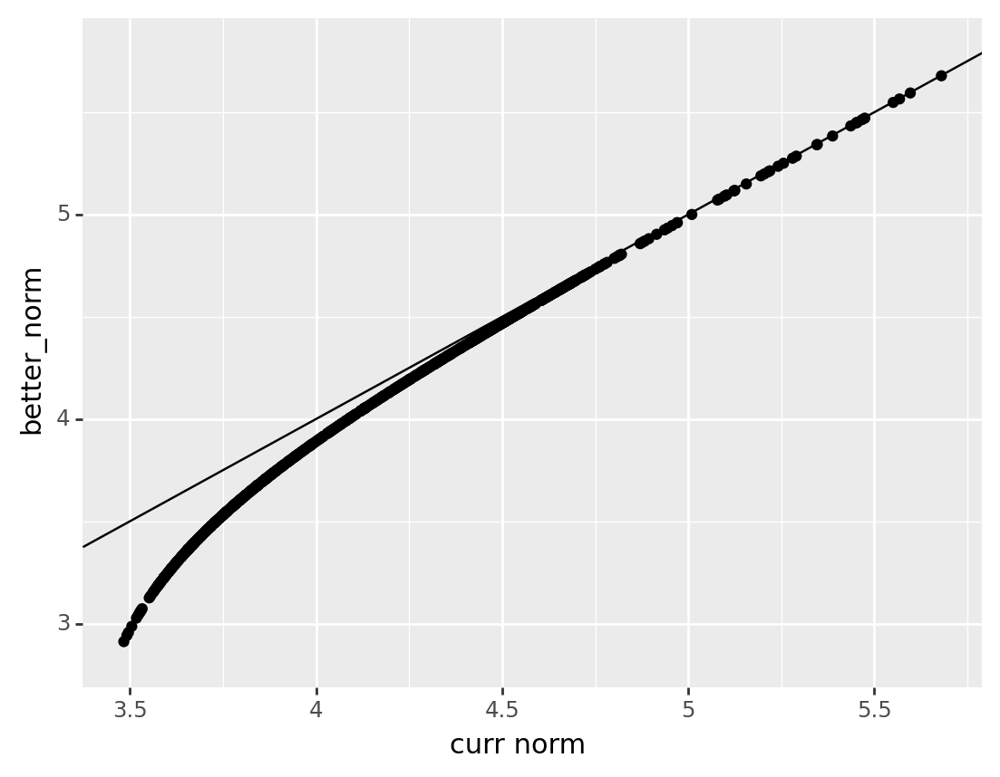

<ggplot: (8785070001517)>

In [188]:
ggplot(pd.DataFrame({"curr norm": curr_norms, "better_norm": ad.obs["normalized biotin"] }), aes(
    x="curr norm", y="better_norm")) + geom_point() + geom_abline(slope = 1, intercept = 0)

In [189]:
## cluster 19 is similar to CD4 T cell clusters 8 and 9 (based on the dendrogram, in supplement), include it for now
ad = ad[(ad.obs.annotation == "CD4") | (ad.obs.leiden == "19")] 
ad.shape

(944, 14332)

## build new neighborhood graph just on CD4 T cells

In [190]:
ad.X = ad.layers["pearson_theta_1"].copy()

In [191]:
sc.pp.neighbors(ad, n_neighbors=30, n_pcs=40, use_rep='X_pca',)
sc.tl.leiden(ad, resolution=1.3)
sc.tl.umap(ad)

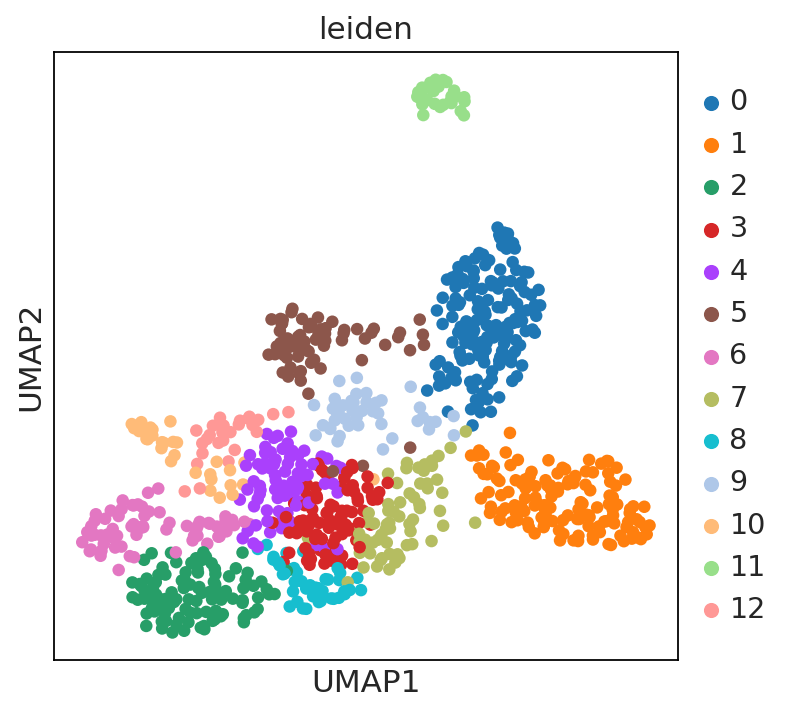

In [192]:
sc.pl.umap(ad, color = "leiden")

## plot on original UMAP

In [193]:
ad.obsm["X_umap_cd4"] = ad.obsm["X_umap"].copy()
ad.obsm["X_umap"] = ad.obsm["X_umap_full"].copy()

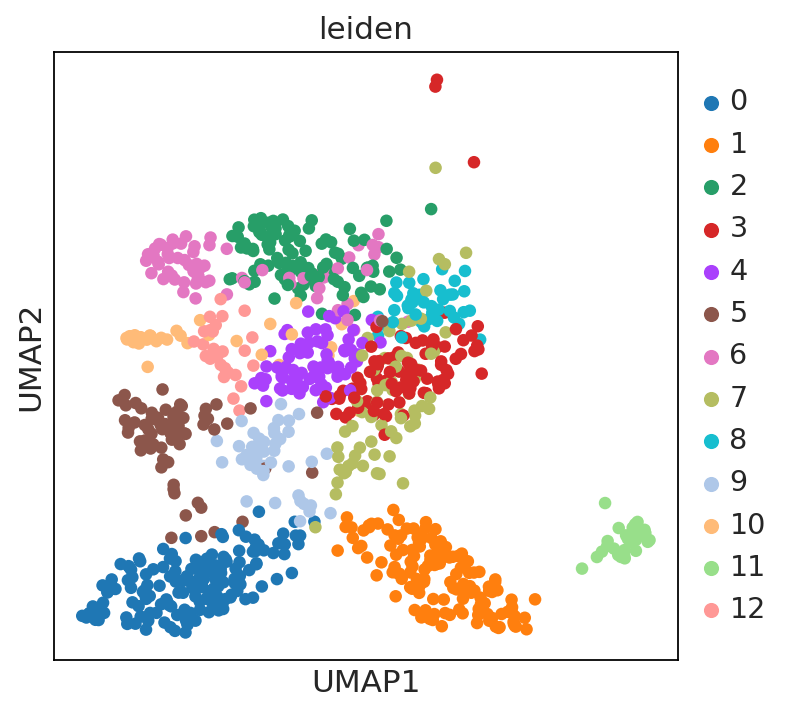

In [194]:
sc.pl.umap(ad, color = "leiden")

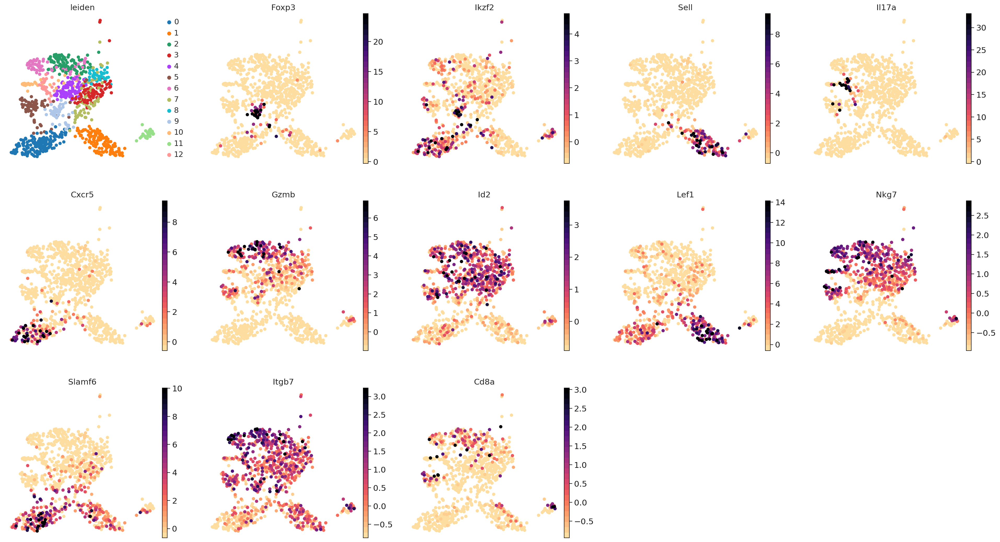

In [195]:
## GEX figure for supplement, should include all clusters
sc.settings.figdir="paper_figures/supplemental/cd4/"
sc.pl.umap(ad, frameon = False,  vmin="p1", vmax="p99", save="_leiden_gex.pdf", cmap=magma_cmap, ncols=5, color = [
    "leiden", "Foxp3", "Ikzf2", "Sell",  "Il17a", "Cxcr5", "Gzmb", "Id2", "Lef1", "Nkg7", "Slamf6", "Itgb7", "Cd8a"]) 

##  annotate these clusters

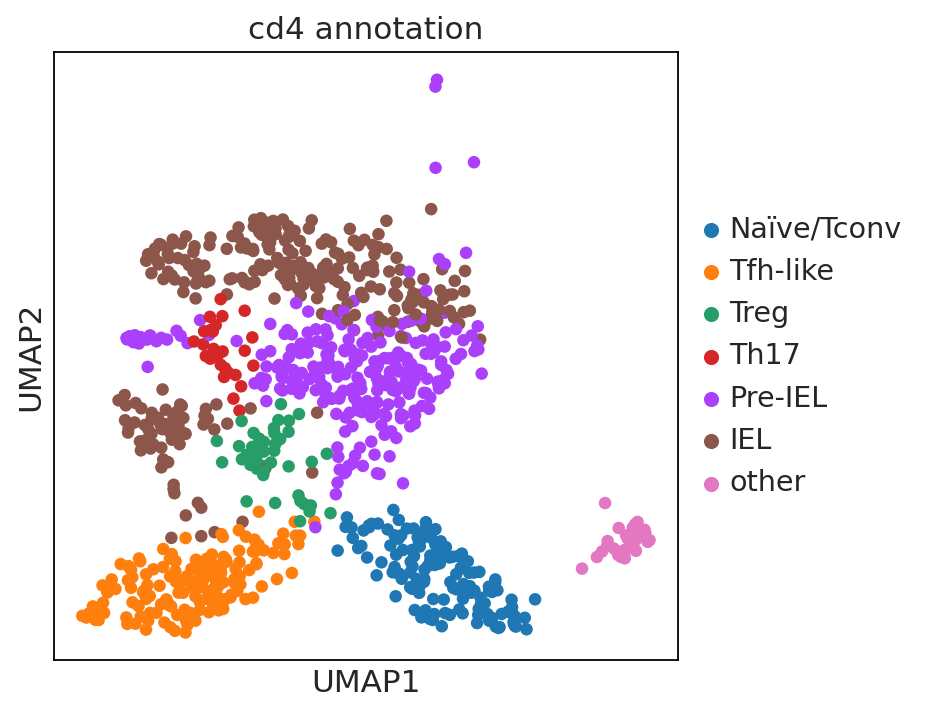

In [196]:

from pandas.api.types import CategoricalDtype

## IEL, for top, and that other one,
## pre-IEL for ones on the right, including the knob thing
## conventional for the 2 bottom ones (naïve-like, Tfh-like )
## tregs
def annotate(cl) :
    c = int(cl)
    if c == 0:
        return "Tfh-like"
    elif c == 1:
        return "Naïve/Tconv"
    elif c == 9:
        return "Treg"
    elif c == 12:
        return "Th17"
    elif c in [5, 6, 2, 8]:
        return "IEL"
    elif c  == 11:
        return "other"
    return "Pre-IEL"
ad.obs["cd4 annotation"] = [annotate(cl) for cl in ad.obs.leiden]
ad.obs["cd4 annotation"] = ad.obs["cd4 annotation"].astype(CategoricalDtype(
    categories=["Naïve/Tconv", "Tfh-like", "Treg", "Th17", "Pre-IEL", "IEL", "other"], ordered = True))
sc.pl.umap(ad, color="cd4 annotation")

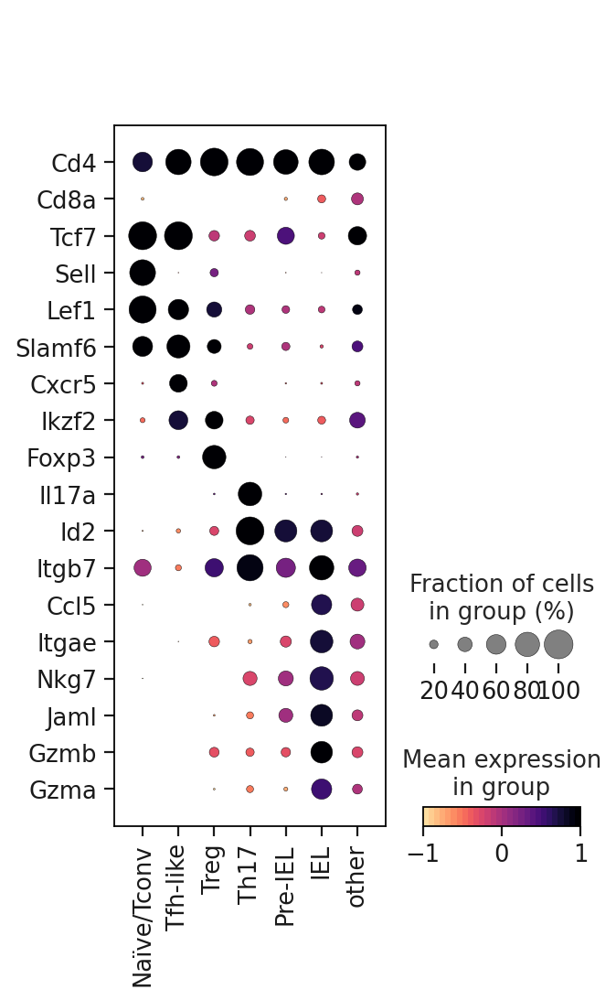

In [199]:
sc.pl.dotplot(ad, swap_axes=True, groupby="cd4 annotation", norm = mpl.colors.Normalize(vmin=-1, vmax=1), 
              cmap=magma_cmap,  var_names = [
                  "Cd4", "Cd8a", "Tcf7", "Sell", "Lef1", "Slamf6", "Cxcr5", "Ikzf2", "Foxp3", "Il17a", "Id2",
                  "Itgb7", "Ccl5", "Itgae", "Nkg7", "Jaml", "Gzmb", "Gzma"])

## remove the weird "Other" cluster, still not sure what it is


In [423]:
?pd.DataFrame.to_excel

In [428]:
cd4_annot_lfcs = make_lfcs(ad,  "raw_counts", "pearson_theta_1", cl_level =  "cd4 annotation", 
                           pseudocount_threshold=0.1)

0.0010928962146863341
IEL


/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/anndata/compat/__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['clone_id']['distances'] that happens to be dimensioned at n_obs×n_obs (915×915).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Genomic

  results: log2FC > 0.5: 190 genes; log2FC < -0.5: 284 genes
Naïve/Tconv


/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:19: RuntimeWarning: divide by zero encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:19: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_funct

  results: log2FC > 0.5: 291 genes; log2FC < -0.5: 324 genes
Pre-IEL


/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:70: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/anndata/compat/__init__.py:263: FutureWarning: During AnnData slicing, found 

  results: log2FC > 0.5: 46 genes; log2FC < -0.5: 374 genes
Tfh-like


/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:19: RuntimeWarning: divide by zero encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:19: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_funct

  results: log2FC > 0.5: 1416 genes; log2FC < -0.5: 121 genes
Th17


/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:19: RuntimeWarning: divide by zero encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:19: RuntimeWarning: invalid value encountered in true_divide
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_funct

  results: log2FC > 0.5: 25 genes; log2FC < -0.5: 6 genes
Treg


/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:19: RuntimeWarning: invalid value encountered in true_divide


  results: log2FC > 0.5: 82 genes; log2FC < -0.5: 7 genes


/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Genomics/pritykinlab/sarah/lipstic_analysis/ulipstic-analysis/helper_functions.py:70: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


In [430]:
write_lfc_spreadsheet(cd4_annot_lfcs, "supplementary_tables/CD4_annotation_LFCs.xls")

/tmp/ipykernel_168193/1895189420.py:3: FutureWarning: As the xlwt package is no longer maintained, the xlwt engine will be removed in a future version of pandas. This is the only engine in pandas that supports writing in the xls format. Install openpyxl and write to an xlsx file instead. You can set the option io.excel.xls.writer to 'xlwt' to silence this warning. While this option is deprecated and will also raise a warning, it can be globally set and the warning suppressed.


In [354]:
ad = ad[ad.obs["cd4 annotation"] != "other"].copy()

/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/anndata/compat/__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['clone_id']['distances'] that happens to be dimensioned at n_obs×n_obs (944×944).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.


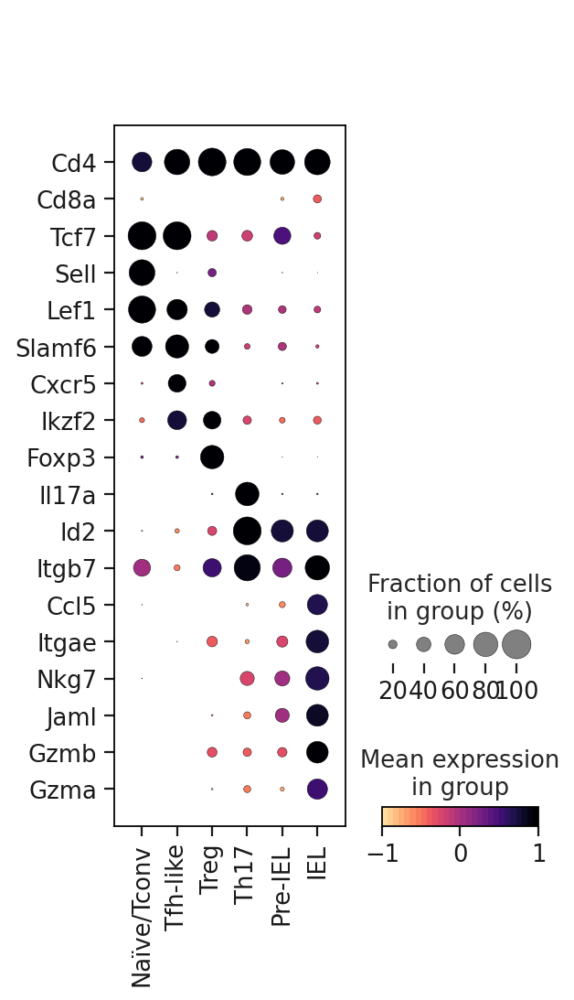

In [405]:
sc.settings.figdir="paper_figures/supplemental/cd4/"
sc.pl.dotplot(ad, swap_axes=True, groupby="cd4 annotation", norm = mpl.colors.Normalize(vmin=-1, vmax=1), 
              cmap=magma_cmap,  save="cd4_gex.pdf", var_names = [
                  "Cd4", "Cd8a", "Tcf7", "Sell", "Lef1", "Slamf6", "Cxcr5", "Ikzf2", "Foxp3", "Il17a", "Id2",
                  "Itgb7", "Ccl5", "Itgae", "Nkg7", "Jaml", "Gzmb", "Gzma"])

In [355]:
ad.shape

(915, 14332)

## <font color="navy"> main figure -- SC panel #3

In [15]:
?sc.set_figure_params

In [20]:
ad.obs[" cd4 annotation "] = ad.obs["cd4 annotation"].str.replace(": ", ":\n")

findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.


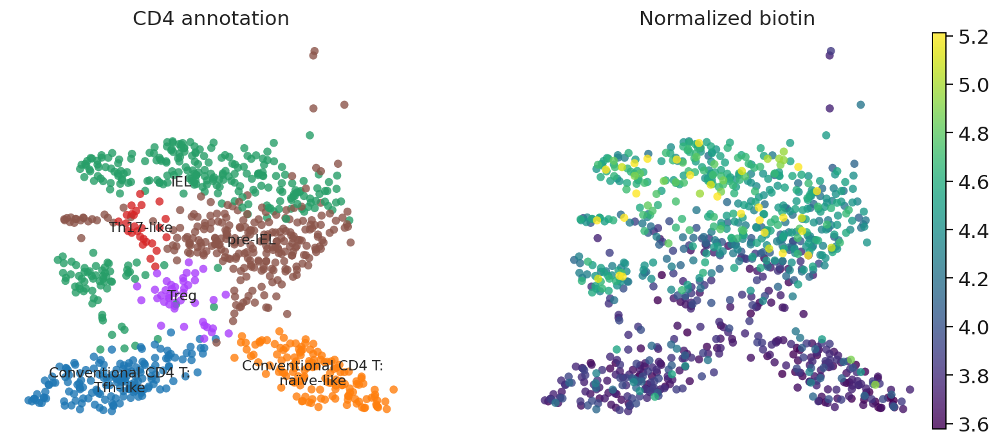

In [30]:
sc.set_figure_params(figsize=(5,5), vector_friendly=False)
sc.settings.figdir="paper_figures/"
sc.pl.umap(ad, color=[" cd4 annotation ", "normalized biotin"], vmin="p2", vmax="p98",
           color_map = "viridis", save="_panel_3.pdf", frameon=False, legend_loc = 'on data',
          legend_fontsize = "x-small", legend_fontweight="medium", alpha = 0.8, title=[
              "CD4 annotation", "Normalized biotin"
          ])

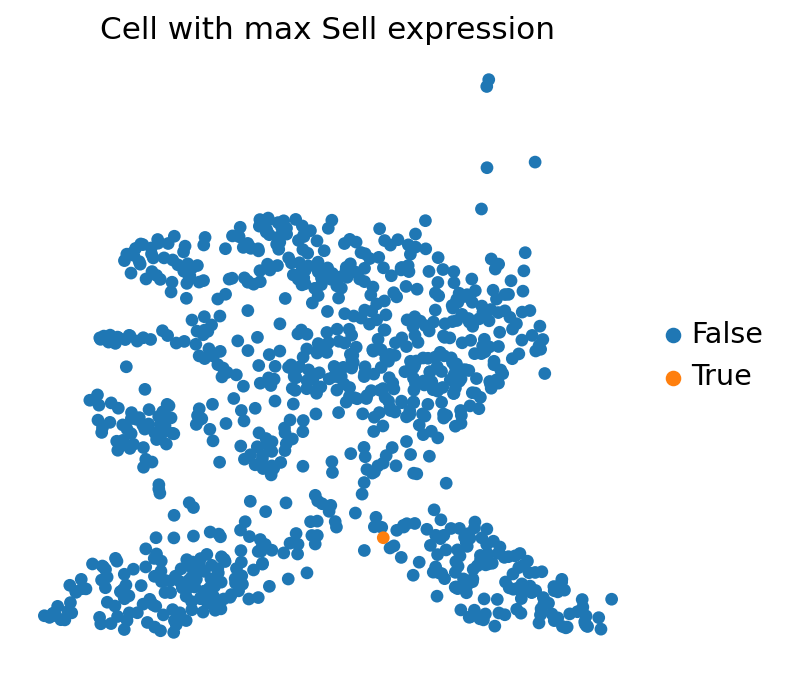

In [24]:
max_sell_i = np.argmax(ad[:, "Sell"].layers["pearson_theta_1"])
ad.obs["max_sell"] = (ad.obs_names == ad.obs_names[max_sell_i]).astype(str)
sc.pl.umap(ad, color=["max_sell"], layer="pearson_theta_1", frameon=False, title = "Cell with max Sell expression")

## generating stuff for trajectory + clonal diversity panel

In [25]:
ad.X = ad.layers["raw_counts"].todense().copy()
sc.pp.normalize_per_cell(ad)
sc.pp.pca(ad)
sc.tl.tsne(adata=ad, n_pcs=30, perplexity=30)
sc.pp.neighbors(ad, n_pcs=30, n_neighbors=10)
sc.tl.diffmap(ad, n_comps=30)

/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/anndata/compat/__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['clone_id']['distances'] that happens to be dimensioned at n_obs×n_obs (915×915).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.


In [26]:
sc.external.tl.wishbone(adata=ad, start_cell = ad.obs_names[ad.obs["max_sell"] == "True"].values[0],
    components=[1, 2], num_waypoints=150,
)

Building lNN graph...
lNN computed in : 0.01 seconds
Determining waypoints if not specified...
Determining shortest path distances and perspectives....
......................................................................................................................................................
Time for determining distances and perspectives: 3.81 seconds
Determining branch point and branch associations...
Running iterations...
Iteration: 2
Correlation with previous iteration:  0.9997
1 realignment iterations


In [27]:
ad.obs["clone id size"] = ad.obs["clone_id_size"].astype("category")

In [91]:
vlag_cmap = mpl.cm.get_cmap("vlag")(np.linspace(0,1,30))
vlag_cmap = vlag_cmap-0.1
# testing = np.concatenate([vlag_cmap[0:8], vlag_cmap[8:10]-0.05, vlag_cmap[10:12]-0.1, vlag_cmap[12:14]-0.15, 
#                          vlag_cmap[14:17]-0.2, vlag_cmap[17:19]-0.15, vlag_cmap[19:21]-0.1, vlag_cmap[21:23]-0.05,
#                          vlag_cmap[17:-1]])
vlag_cmap[:, 3] = 1.0
vlag_cmap = mpl.colors.ListedColormap(vlag_cmap)

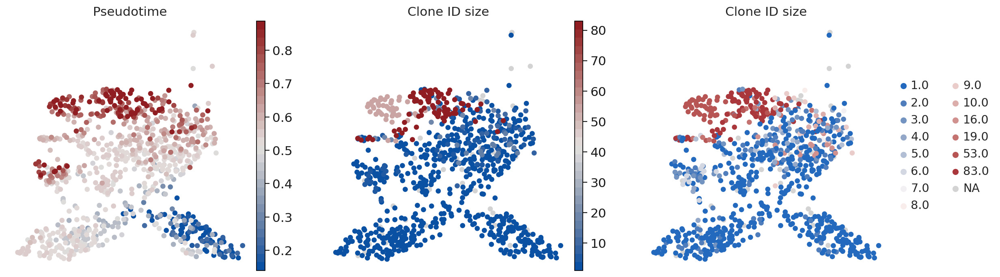

In [92]:
%matplotlib inline
sc.set_figure_params(figsize=(5,5), vector_friendly=False)
sc.settings.figdir="paper_figures/"
sc.pl.umap(ad, color=['trajectory_wishbone', "clone_id_size", "clone id size"],
           cmap=vlag_cmap, vmin="p5", vmax="p95", title = ["Pseudotime", "Clone ID size", "Clone ID size"],
           frameon = False, save="_panel_4.pdf", palette = "vlag")

/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/wishbone/wb.py:1624: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/wishbone/wb.py:1624: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/wishbone/wb.py:1624: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/wishbone/wb.py:1624: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/wishbone/wb.py:1624: FutureWarning: The serie

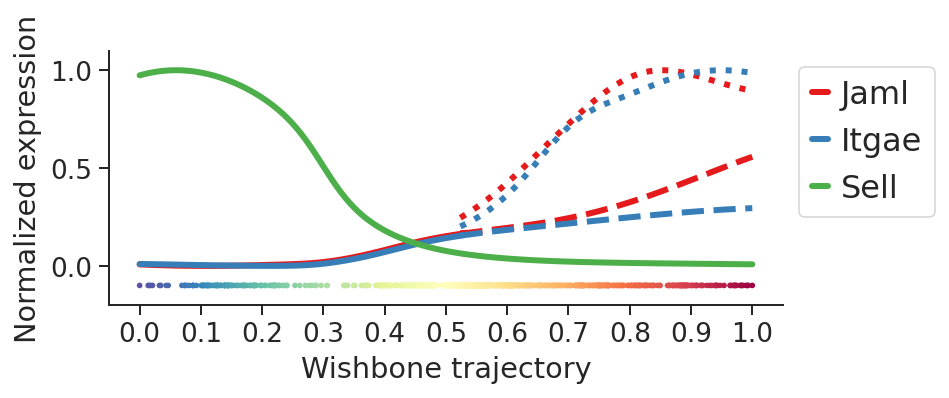

In [22]:
sc.external.pl.wishbone_marker_trajectory(ad, ["Jaml", "Itgae", "Sell"])

## Make sure that trying different cells for general starting location doesn't affect pseudotime analysis

In [98]:
def testing_wishbone_roots(ad):
    ad.X = ad.layers["raw_counts"].copy()
    sc.pp.normalize_per_cell(ad)
    sc.pp.pca(ad)
    sc.tl.tsne(adata=ad, n_pcs=30, perplexity=30)
    sc.pp.neighbors(ad, n_pcs=15, n_neighbors= 30)
    sc.tl.diffmap(ad, n_comps=10)
    root_cells = np.random.choice(ad.obs_names[ad.obs.leiden == "1"], 15)
    ad.obs["root_cell"] = [str (cell in root_cells) for cell in ad.obs_names]
    sc.pl.umap(ad, color="root_cell")
    sc.pl.diffmap(ad, color="leiden", )
    wishbone_results = pd.DataFrame()
    for root_cell in root_cells:
        sc.external.tl.wishbone(adata = ad, start_cell = root_cell, components=[1,2], num_waypoints=150)
        wishbone_results = pd.concat([wishbone_results, pd.DataFrame({"root cell": root_cell,
                                                                      "pseudotime": ad.obs.trajectory_wishbone})])
    return wishbone_results

/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/anndata/compat/__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['clone_id']['distances'] that happens to be dimensioned at n_obs×n_obs (915×915).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.


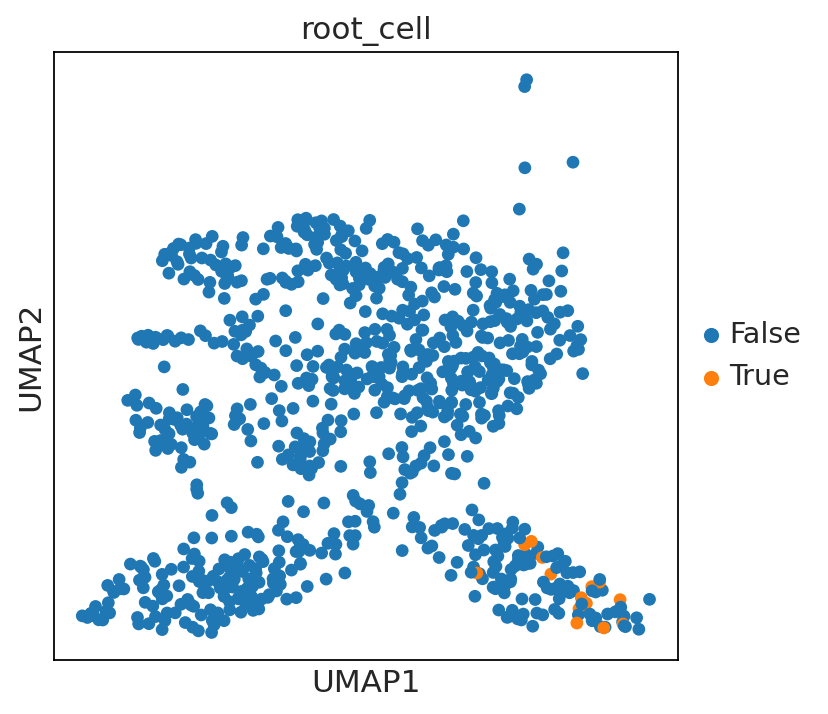

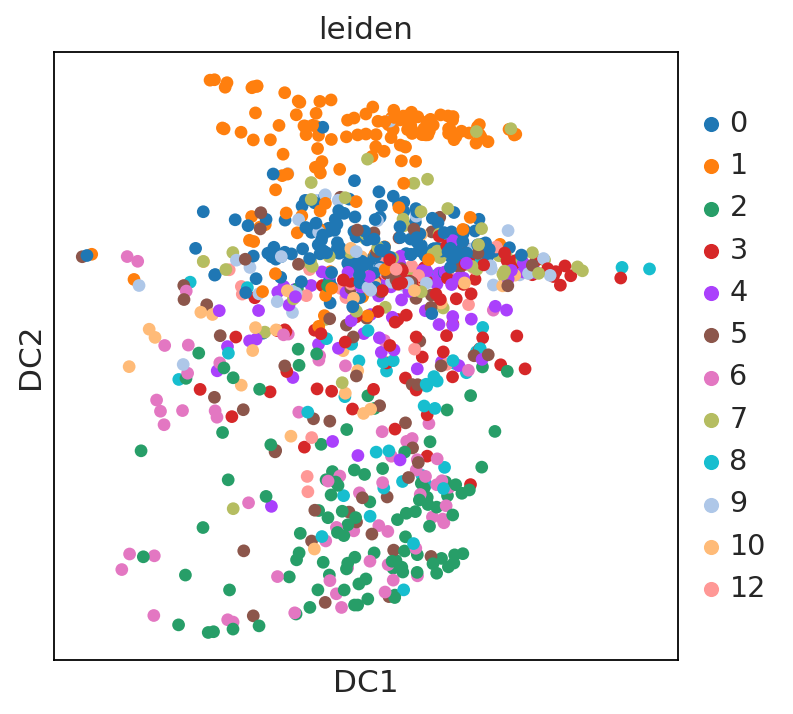

Building lNN graph...
lNN computed in : 0.01 seconds
Determining waypoints if not specified...
Determining shortest path distances and perspectives....
......................................................................................................................................................
Time for determining distances and perspectives: 4.04 seconds
Determining branch point and branch associations...
Running iterations...
Iteration: 2
Correlation with previous iteration:  0.9994
1 realignment iterations
Building lNN graph...
lNN computed in : 0.01 seconds
Determining waypoints if not specified...
Determining shortest path distances and perspectives....
......................................................................................................................................................
Time for determining distances and perspectives: 4.38 seconds
Determining branch point and branch associations...
Running iterations...
Iteration: 2
Correlation with previous 

In [100]:
test_wishbone = testing_wishbone_roots(ad)

In [101]:
test_wishbone.head()

,root cell,pseudotime
AAACGGGGTCTGGTCG-1,CTGTTTAAGGTAAACT-1,0.493868
AAACGGGGTGGGTATG-1,CTGTTTAAGGTAAACT-1,0.973899
AAAGATGGTCAATACC-1,CTGTTTAAGGTAAACT-1,0.116916
AAAGATGGTCTTTCAT-1,CTGTTTAAGGTAAACT-1,0.450134
AAAGATGTCAGTACGT-1,CTGTTTAAGGTAAACT-1,0.542152


In [118]:
ad.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,doublet_score,predicted_doublet,potential_doublet,sample,raw_biotin,...,clone_id_size,cd4 annotation,cd4 annotation,max_sell,n_counts,trajectory_wishbone,branch_wishbone,clone id size,cd4 annotation,root_cell
AAACGGGGTCTGGTCG-1,1938,1938,8362.0,35.0,0.418560,0.058353,False,False,IEL 4,424.0,...,2.0,IEL,IEL,False,4443.0,0.501251,1,2.0,IEL,False
AAACGGGGTGGGTATG-1,2475,2474,14536.0,56.0,0.385250,0.063721,False,False,IEL 2,637.0,...,1.0,IEL,IEL,False,6317.0,0.973665,2,1.0,IEL,False
AAAGATGGTCAATACC-1,683,683,1952.0,6.0,0.307377,0.008696,False,False,IEL 4,48.0,...,NaN,Conventional CD4 T: naïve-like,Conventional CD4 T:\nnaïve-like,False,1242.0,0.117518,1,NaN,Conv CD4 T:\nnaïve-like,False
AAAGATGGTCTTTCAT-1,2485,2485,8568.0,88.0,1.027078,0.058353,False,False,IEL 2,291.0,...,1.0,IEL,IEL,False,6021.0,0.453596,1,1.0,IEL,False
AAAGATGTCAGTACGT-1,2639,2639,9675.0,80.0,0.826873,0.023787,False,False,IEL 3,570.0,...,2.0,pre-IEL,pre-IEL,False,6130.0,0.545921,1,2.0,pre-IEL,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGCGCAGTGCCATT-1,2192,2192,7436.0,75.0,1.008607,0.019676,False,False,IEL 3,59.0,...,1.0,Conventional CD4 T: Tfh-like,Conventional CD4 T:\nTfh-like,False,5143.0,0.467031,1,1.0,Conv CD4 T:\nTfh-like,False
TTTGCGCTCGCGATCG-1,2415,2412,8689.0,42.0,0.483370,0.126437,False,False,IEL 3,439.0,...,1.0,pre-IEL,pre-IEL,False,5534.0,0.533334,1,1.0,pre-IEL,False
TTTGGTTCAGGGTTAG-1,3087,3086,11148.0,107.0,0.959813,0.032115,False,False,IEL 2,334.0,...,2.0,pre-IEL,pre-IEL,False,7687.0,0.554153,3,2.0,pre-IEL,False
TTTGGTTGTCTTCAAG-1,1883,1883,6656.0,68.0,1.021635,0.023787,False,False,IEL 3,174.0,...,1.0,pre-IEL,pre-IEL,False,4490.0,0.523884,1,1.0,pre-IEL,False


In [102]:
test_wishbone = test_wishbone.reset_index().rename(columns={"index": "cell"}).pivot_table(
    index="cell", columns = "root cell", values="pseudotime")

In [119]:
sc.external.tl.wishbone(adata=ad, start_cell = ad.obs_names[ad.obs["max_sell"] == "True"].values[0],
    components=[1, 2], num_waypoints=150,
)

Building lNN graph...
lNN computed in : 0.01 seconds
Determining waypoints if not specified...
Determining shortest path distances and perspectives....
......................................................................................................................................................
Time for determining distances and perspectives: 4.22 seconds
Determining branch point and branch associations...
Running iterations...
Iteration: 2
Correlation with previous iteration:  0.9996
1 realignment iterations


In [120]:
test_wishbone["current root"] = ad.obs["trajectory_wishbone"]

## calculate pseudotime correlations for every pair of root cells

In [123]:
from itertools import permutations
root_corrs = pd.DataFrame()
for c1, c2 in list(permutations(test_wishbone.columns[::-1], 2)):
    root_corrs = pd.concat([root_corrs, pd.DataFrame({"root 1": [c1], "root 2": [c2], "corr": [spearmanr(
        test_wishbone[c1], test_wishbone[c2])[0]]})])

In [283]:
np.unique(root_corrs["root 2"])

array(['ACGGCCACAGTCACTA-1', 'ATCATCTAGGGTGTTG-1', 'CACTCCACAATGGAAT-1',
       'CATCAAGGTAGGCATG-1', 'CGCGGTAGTCTCCCTA-1', 'CGTTCTGCAAGCTGAG-1',
       'CTGTTTAAGGTAAACT-1', 'GAATGAACATCCGGGT-1', 'GGACATTCAGGGCATA-1',
       'GTGTTAGTCAACGGGA-1', 'TAAACCGGTAGCGTAG-1', 'TAGTGGTAGACAGACC-1',
       'TCATTACGTTCCACAA-1', 'TGATTTCCATCACGTA-1', 'current root'],
      dtype=object)

In [285]:
root_corrs["current root"] = (root_corrs["root 2"] == "current root") | (root_corrs["root 1"] == "current root")

/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/stats/stat_bin.py:95: PlotnineWarning: 'stat_bin()' using 'bins = 15'. Pick better value with 'binwidth'.


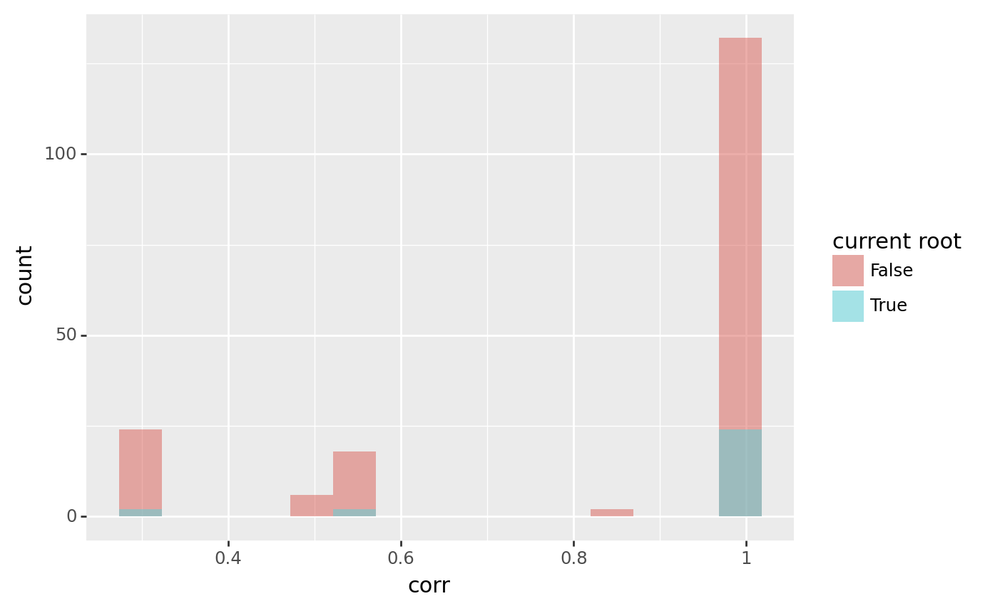

<ggplot: (8785069560724)>

In [300]:
ggplot(root_corrs, aes(x="corr", fill = "current root")) + geom_histogram(position="identity", alpha = 0.5)

In [306]:
root_corrs["root_1"]  = root_corrs["root 1"]

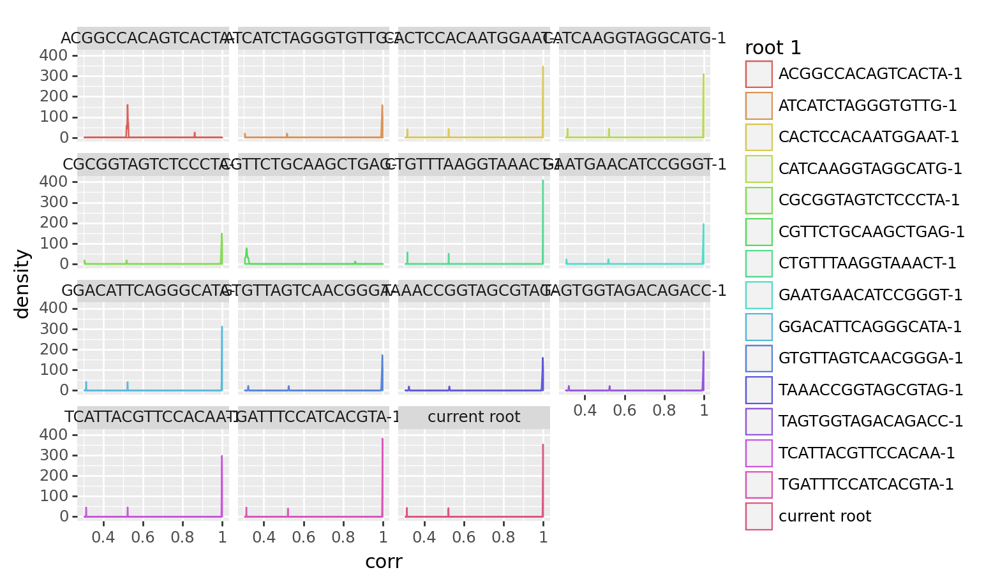

<ggplot: (8785068580768)>

In [307]:
ggplot(root_corrs, aes(x="corr", color = "root 1")) + geom_density()  + facet_wrap("~ root_1") + theme_minimal() + \
theme()

/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/stats/stat_bin.py:95: PlotnineWarning: 'stat_bin()' using 'bins = 15'. Pick better value with 'binwidth'.


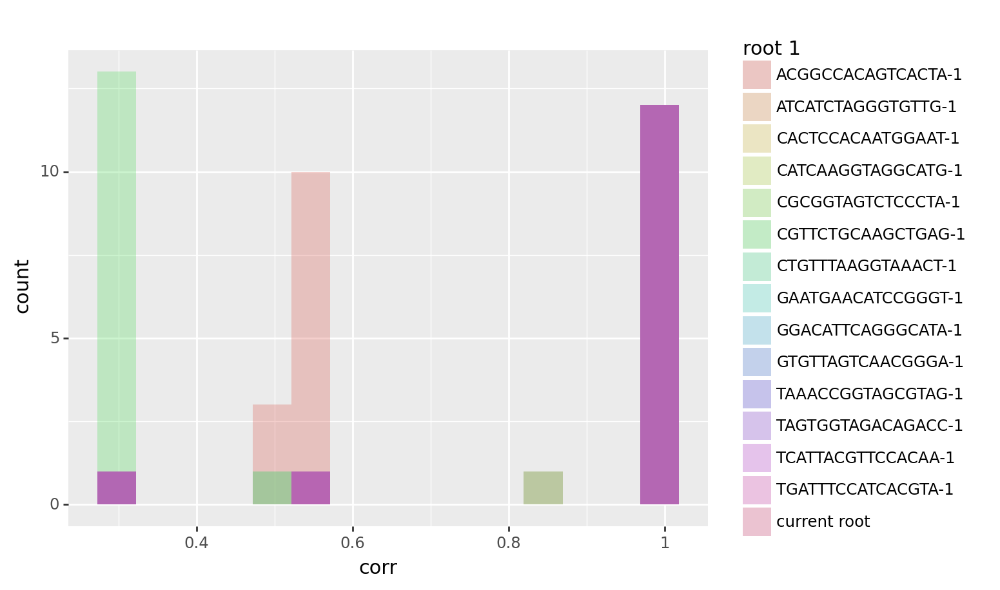

<ggplot: (8784950245157)>

In [298]:
ggplot(root_corrs, aes(x="corr", fill = "root 1")) + geom_histogram(position="identity", alpha = 0.3)

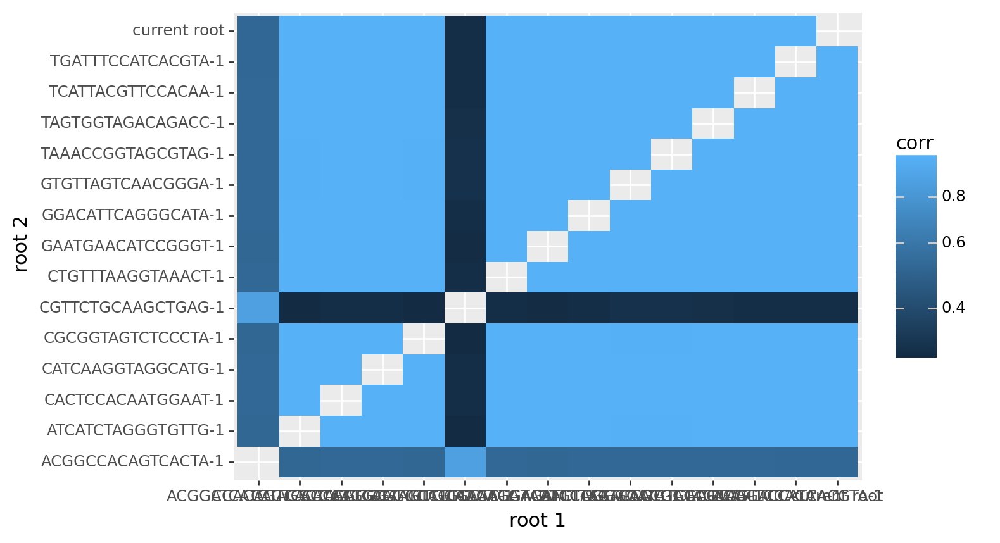

<ggplot: (8785076203948)>

In [295]:
ggplot(root_corrs, aes(x="root 1", y="root 2", fill="corr", label = "corr")) + geom_tile() + scale_fill_gradient(
    trans = "log")


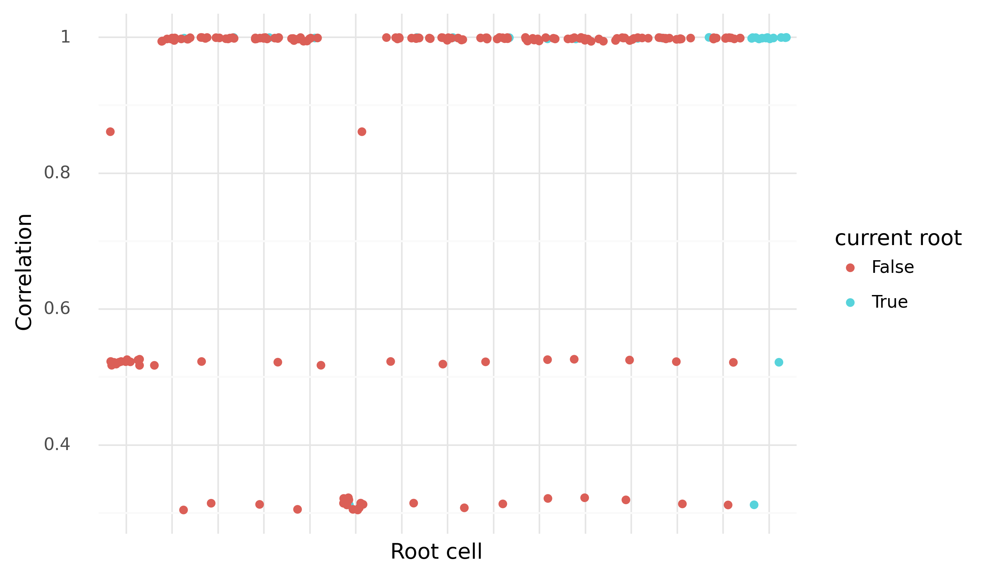

<ggplot: (8784949846956)>

In [291]:
ggplot(root_corrs, aes(x="root 1", y="corr", color = "current root")) + geom_point(position="jitter") + \
theme_minimal() + theme(dpi=200, axis_text_x=element_blank()) + labs(x="Root cell", y="Correlation")

In [124]:
root_corrs[root_corrs["root 1"] == "current root"]

,root 1,root 2,corr
0,current root,TGATTTCCATCACGTA-1,0.999788
0,current root,TCATTACGTTCCACAA-1,0.998890
0,current root,TAGTGGTAGACAGACC-1,0.998339
0,current root,TAAACCGGTAGCGTAG-1,0.997498
0,current root,GTGTTAGTCAACGGGA-1,0.997644
0,current root,GGACATTCAGGGCATA-1,0.999360
0,current root,GAATGAACATCCGGGT-1,0.999472
0,current root,CTGTTTAAGGTAAACT-1,0.999569
0,current root,CGTTCTGCAAGCTGAG-1,0.312070
0,current root,CGCGGTAGTCTCCCTA-1,0.998840


In [ ]:
p_corrs = ggplot(root_corrs[root_corrs["root 1"] == "current root"], aes(x="root 1", y="corr", color="root 2")) + \
geom_jitter(width=0.1, height=0) + theme_minimal() + coord_flip() + labs(y="Spearman rho", x="Current root") + \
theme(dpi=200, legend_position = "none", figure_size=(4,1), axis_text=element_blank())
p_corrs

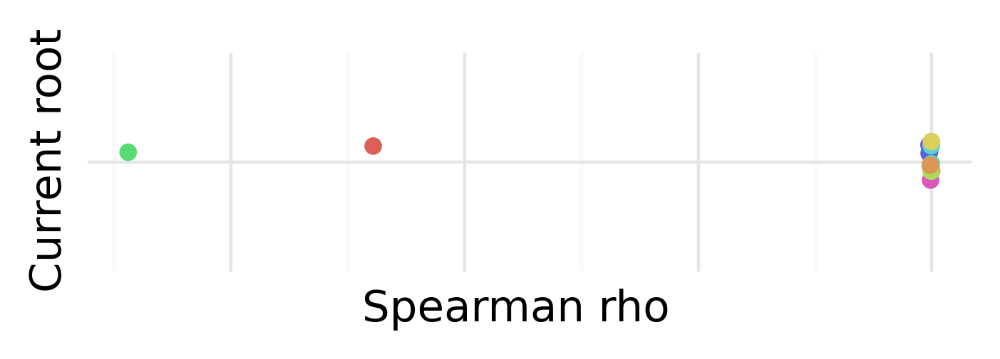

<ggplot: (8784398412816)>

In [281]:
p_corrs = ggplot(root_corrs[root_corrs["root 1"] == "current root"], aes(x="root 1", y="corr", color="root 2")) + \
geom_jitter(width=0.1, height=0) + theme_minimal() + coord_flip() + labs(y="Spearman rho", x="Current root") + \
theme(dpi=200, legend_position = "none", figure_size=(4,1), axis_text=element_blank())
p_corrs

In [129]:
bad_root_cells = root_corrs[(root_corrs["root 1"] == "current root") & (root_corrs["corr"] < 0.9)]["root 2"].values
bad_root_cells

array(['CGTTCTGCAAGCTGAG-1', 'ACGGCCACAGTCACTA-1'], dtype=object)

In [130]:
root_corrs[(root_corrs["root 1"] == bad_root_cells[0]) & (root_corrs["root 2"] == bad_root_cells[1])]

,root 1,root 2,corr
0,CGTTCTGCAAGCTGAG-1,ACGGCCACAGTCACTA-1,0.861039


In [138]:
ggsave(p_corrs, "paper_figures/supplemental/cd4/wishbone_test_root.pdf")

/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/ggplot.py:718: PlotnineWarning: Saving 4 x 1 in image.
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Filename: paper_figures/supplemental/cd4/wishbone_test_root.pdf


In [139]:
root_corrs.shape

(210, 3)

In [141]:
len(np.unique(root_corrs["root 2"]))

15

In [142]:
root_corrs[root_corrs["root 1"] == "current root"].shape

(14, 3)

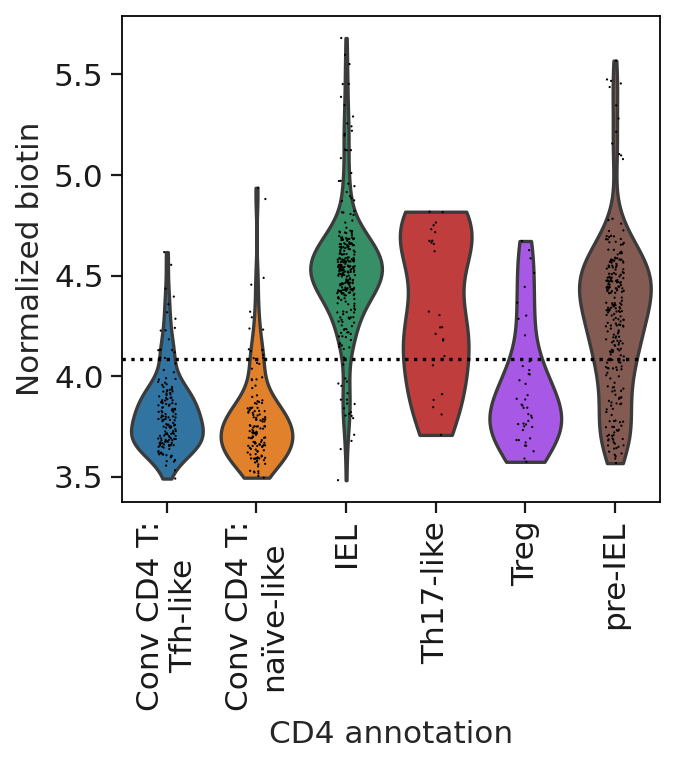

In [38]:
sc.set_figure_params(figsize=(4.5, 4), vector_friendly=False)
norm_biotin_pos_threshold = 4.0873827144682675 ## from previous notebook, this should be saved in helper functions
ad.obs["cd4 annotation "] = ad.obs["cd4 annotation"].str.replace("Conventional ", "Conv ").str.replace(
"T: ", "T:\n")
ax = sc.pl.violin(ad, groupby="cd4 annotation ", keys = "normalized biotin", ax = None, show = False, rotation=90)
ax.grid(False)
ax.axhline(norm_biotin_pos_threshold, color = "black", linestyle="dotted")
plt.xlabel("CD4 annotation")
plt.ylabel("Normalized biotin")
plt.savefig("paper_figures/violin_panel_5.pdf",  bbox_inches='tight')
sc.set_figure_params(figsize=(5,5))

## explore some clones, see how they are shared across cell types/clusters

In [24]:
ad.uns["cd4 annotation_colors"]

array(['#1f77b4', '#ff7f0e', '#279e68', '#d62728', '#aa40fc', '#8c564b'],
      dtype='<U7')

## make cluster plot

In [388]:
## use this so numeric order of leiden categories
level=" leiden " 
leiden = " leiden "
df = pd.DataFrame()
for cl in np.unique(ad.obs[leiden]):
    filtered_ad = ad[(ad.obs.clone_id.isin(ad.obs[ad.obs[leiden] == cl][["clone_id"]].dropna().clone_id.unique()))
                    & (ad.obs.clone_id_size > 1)]
    filtered_ad.obs.clone_id = filtered_ad.obs.clone_id.astype(CategoricalDtype(
        categories = filtered_ad.obs.sort_values("clone_id_size", ascending=False)["clone_id"].astype(
            str).unique(), ordered = True))
    new_df = filtered_ad.obs[[level, "clone_id", "clone_id_size"]]
    new_df["cluster"] = cl
    df = pd.concat([df, new_df])
levels = [ np.where(ad.obs[level].cat.categories == cl)[0][0] for cl in np.unique(df[level])]
df["clone_id"] = df["clone_id"].astype(CategoricalDtype(
    ordered = True, categories=df.sort_values("clone_id_size", ascending = False)["clone_id"].unique()))
df["cluster"] = df["cluster"].astype(CategoricalDtype(categories=[ 
    str(i) for i in range(11)] + ["12"], ordered = True))
df[level] = df[level].astype(CategoricalDtype(categories=[ 
    str(i) for i in range(11)] + ["12"], ordered = True))

test = df.groupby(["clone_id", "cluster"]).count()[
    [level]].drop_duplicates().reset_index()
counting_df = df[["clone_id", "clone_id_size", "cluster"]].drop_duplicates(ignore_index = True)
counting_df["clone_id_size"] = counting_df["clone_id_size"].astype(int)

/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/anndata/compat/__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['clone_id']['distances'] that happens to be dimensioned at n_obs×n_obs (915×915).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/pandas/core/generic.py:5604: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/tmp/ipykernel_168193/1026399633.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/anndata/compat/__init__.py:263: FutureWarning: Durin

/tmp/ipykernel_168193/1026399633.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/anndata/compat/__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['clone_id']['distances'] that happens to be dimensioned at n_obs×n_obs (915×915).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/pandas/core/generic.py:5604: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/tmp/ipykernel_168193/1026399633.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from 

In [402]:
p = ggplot(df, aes(x="clone_id", fill=level)) + geom_bar(position = "fill") + facet_wrap(
    "~ cluster", scales="free_x", ncol=3) + theme_minimal() + \
theme(axis_text_x = element_blank(), dpi = 200, axis_ticks_major_x=element_blank(), 
      subplots_adjust={'wspace':0.1}, figure_size=(15, 20) ) + scale_fill_manual(
    np.array(ad.uns["%s_colors"%level])[[levels]]) +  geom_text(
    aes(x="clone_id", label="clone_id_size"),  color="black", y=1.01, inherit_aes= False, 
    data= counting_df, size = 9) + labs(x="TCR Clone", y="Fraction of cells in clone from each cluster")
# 

/tmp/ipykernel_168193/1418381390.py:5: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/facets/facet.py:440: PlotnineWarning: If you need more space for the y-axis tick text use ... + theme(subplots_adjust={'hspace': 0.25}). Choose an appropriate value for 'hspace'


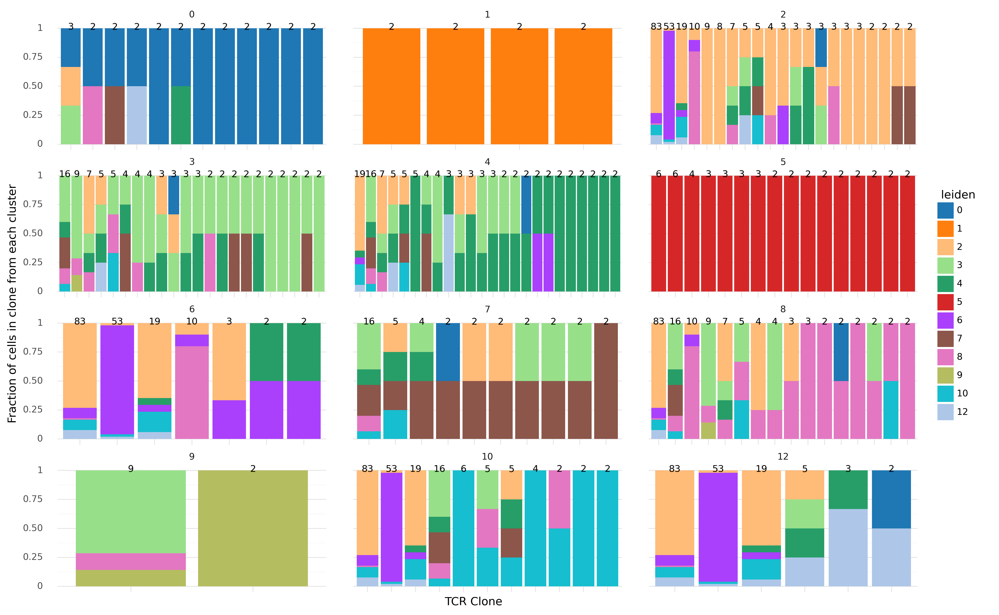

<ggplot: (8784381741481)>

In [403]:
p

In [404]:
ggsave(p, "paper_figures/supplemental/cd4/clone_sharing_leiden.all_cl.pdf")

/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/ggplot.py:718: PlotnineWarning: Saving 15 x 10 in image.
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Filename: paper_figures/supplemental/cd4/clone_sharing_leiden.all_cl.pdf
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/facets/facet.py:440: PlotnineWarning: If you need more space for the y-axis tick text use ... + theme(subplots_adjust={'hspace': 0.25}). Choose an appropriate value for 'hspace'


## MAKE NEW CLONE PLOT

In [364]:
ad.obs[" leiden "]  = ad.obs["leiden"].astype(CategoricalDtype(
    categories=[ str(i) for i in range(11)] + ["12"], ordered = True))

In [367]:
ad.obs[" leiden "]

AAACGGGGTCTGGTCG-1    5
AAACGGGGTGGGTATG-1    5
AAAGATGGTCAATACC-1    1
AAAGATGGTCTTTCAT-1    5
AAAGATGTCAGTACGT-1    7
                     ..
TTTGCGCAGTGCCATT-1    0
TTTGCGCTCGCGATCG-1    7
TTTGGTTCAGGGTTAG-1    3
TTTGGTTGTCTTCAAG-1    4
TTTGTCACATACGCTA-1    5
Name:  leiden , Length: 915, dtype: category
Categories (12, object): ['0' < '1' < '2' < '3' ... '8' < '9' < '10' < '12']

/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/facets/facet.py:440: PlotnineWarning: If you need more space for the y-axis tick text use ... + theme(subplots_adjust={'hspace': 0.25}). Choose an appropriate value for 'hspace'


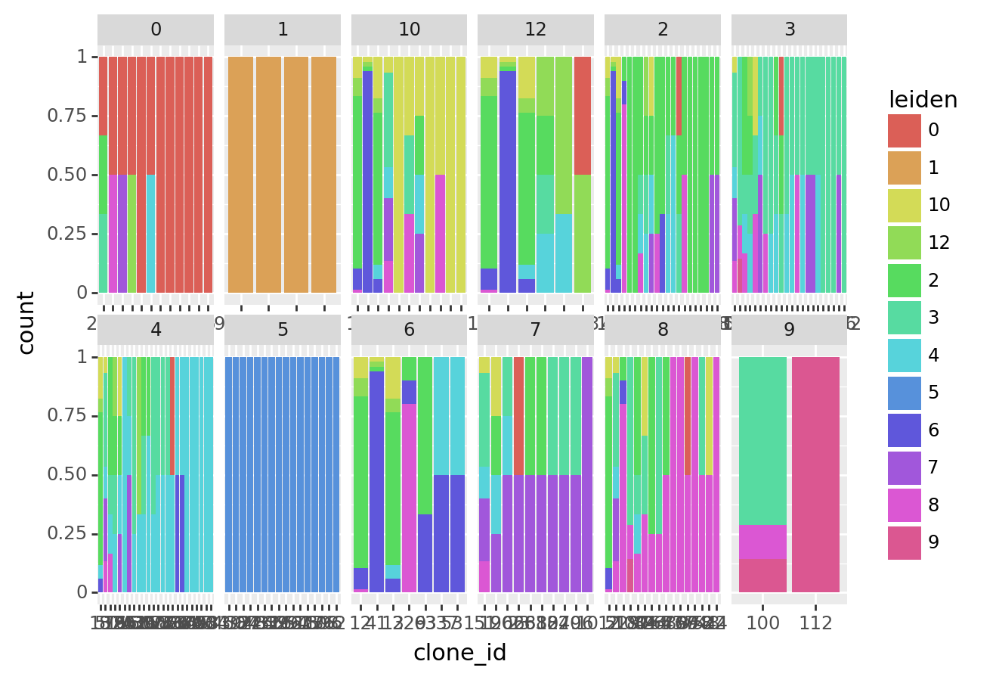

<ggplot: (8784965642933)>

In [378]:
ggplot(df, aes(x="clone_id", fill="leiden")) + geom_bar(position = "fill") + facet_wrap(
    "~ cluster", scales="free_x", ncol=6)# + \
 #   theme(axis_text_x = element_blank(), dpi = 200, axis_ticks_major_x=element_blank(), 
 #         subplots_adjust={'wspace':0.1}, figure_size=(14, 4) ) + scale_fill_manual(
 #       np.array(ad.uns["%s_colors"%level])[[levels]]) + geom_text(aes(
 #3       x="clone_id", label="clone_id_size"),  color="black", y=1, inherit_aes= False, data= counting_df, size = 10)
# 

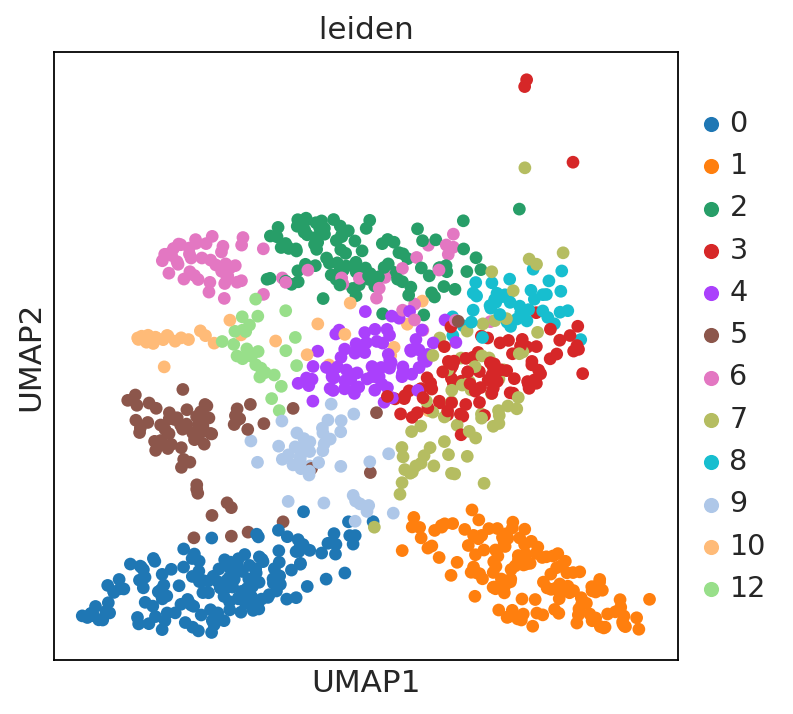

In [381]:
sc.pl.umap(ad, color = " leiden ")

In [382]:
df, p = make_cl_plot(" leiden ")

/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/anndata/compat/__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['clone_id']['distances'] that happens to be dimensioned at n_obs×n_obs (915×915).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/pandas/core/generic.py:5604: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/tmp/ipykernel_168193/2486612160.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/anndata/compat/__init__.py:263: FutureWarning: Durin

    clone_id  clone_id_size cluster
0         23            2.0       0
1         30            2.0       0
2         99            2.0       0
3        104            2.0       0
4        152            2.0       0
..       ...            ...     ...
146      653            3.0       8
147      748            2.0       8
148      766            2.0       8
149      100            9.0       9
150      112            2.0       9

[151 rows x 3 columns]
    clone_id  clone_id_size cluster
0         23              2       0
1         30              2       0
2         99              2       0
3        104              2       0
4        152              2       0
..       ...            ...     ...
146      653              3       8
147      748              2       8
148      766              2       8
149      100              9       9
150      112              2       9

[151 rows x 3 columns]


/tmp/ipykernel_168193/2486612160.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/anndata/compat/__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['clone_id']['distances'] that happens to be dimensioned at n_obs×n_obs (915×915).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/pandas/core/generic.py:5604: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/tmp/ipykernel_168193/2486612160.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from 

/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/facets/facet.py:440: PlotnineWarning: If you need more space for the y-axis tick text use ... + theme(subplots_adjust={'hspace': 0.25}). Choose an appropriate value for 'hspace'


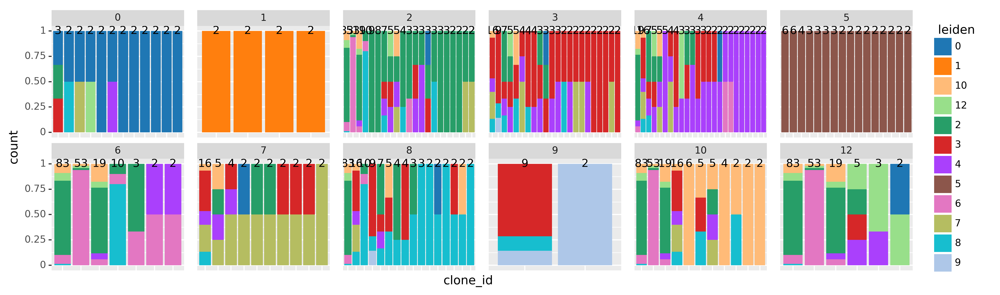

<ggplot: (8784396039593)>

In [383]:
p

In [374]:
df["leiden"].astype(int)

AAATGCCCATCGGTTA-1    0
AACCATGCAATCGGTT-1    0
ACCTTTATCCGTTGCT-1    8
ACGATACAGTGTACTC-1    0
ACTTACTCAAGTTAAG-1    0
                     ..
CAGAGAGAGAAGATTC-1    8
CGACCTTCATTGCGGC-1    3
CTGATAGTCAACACCA-1    9
GATCAGTTCTTGGGTA-1    3
GTACTTTTCCCGACTT-1    3
Name: leiden, Length: 1118, dtype: int64

/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/facets/facet.py:440: PlotnineWarning: If you need more space for the y-axis tick text use ... + theme(subplots_adjust={'hspace': 0.25}). Choose an appropriate value for 'hspace'


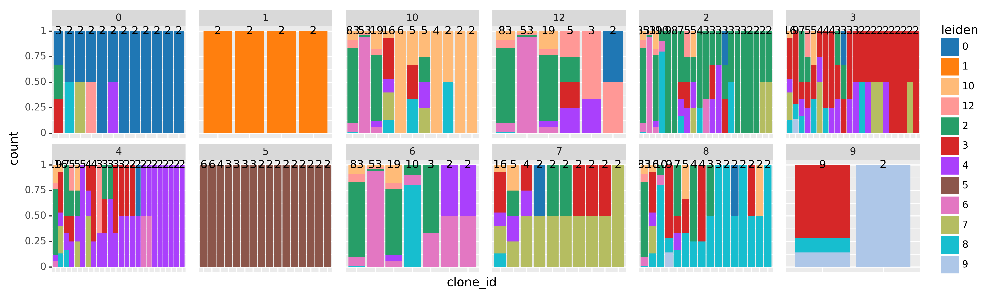

<ggplot: (8784379630674)>

In [370]:
p

In [257]:
cluster_clone_sizes = df[["cd4 annotation", "clone_id_size", "cluster"]].drop_duplicates().groupby("cluster").sum()[[
    "clone_id_size"]].reset_index()
cluster_clone_sizes["clone_id_size"] = cluster_clone_sizes["clone_id_size"].astype(int)
cluster_clone_sizes.head()

,cluster,clone_id_size
0,0,17
1,1,2
2,10,521
3,11,5
4,12,490


In [260]:
df[["cd4 annotation", "clone_id_size", "cluster"]].drop_duplicates().groupby("cluster").sum()


KeyboardInterrupt



In [263]:
np.sum(df[df["cluster"] == "1"]["clone_id_size"])

16.0

In [267]:
df[df["cluster"] == "1"]

,cd4 annotation,clone_id,clone_id_size,cluster
AACTCAGAGGAGTCTG-1,Naïve/Tconv,40,2.0,1
ACTGATGCATCTACGA-1,Naïve/Tconv,40,2.0,1
CGTTGGGCACTACAGT-1,Naïve/Tconv,482,2.0,1
CTCGGGATCGTTTGCC-1,Naïve/Tconv,521,2.0,1
GACCTGGGTTCTCATT-1,Naïve/Tconv,589,2.0,1
GCGCCAAAGTCCTCCT-1,Naïve/Tconv,589,2.0,1
GCTTGAAAGTACCGGA-1,Naïve/Tconv,521,2.0,1
GTGGGTCCATCCGTGG-1,Naïve/Tconv,482,2.0,1


In [268]:
df.shape

(1125, 4)

In [273]:
cluster_clone_sizes = df[["clone_id_size", "clone_id", "cluster"]].drop_duplicates(ignore_index = True).groupby(
    "cluster").sum()[["clone_id_size"]].reset_index()

In [276]:
cluster_clone_sizes["clone_id_size"] = cluster_clone_sizes["clone_id_size"].astype(int)
cluster_clone_sizes.head()

,cluster,clone_id_size
0,0,25
1,1,8
2,10,197
3,11,7
4,12,165


['IEL', 'Naïve/Tconv', 'Pre-IEL', 'Tfh-like', 'Th17', 'Treg', 'other']

array(['#8c564b', '#1f77b4', '#aa40fc', '#ff7f0e', '#d62728', '#279e68',
       '#e377c2'], dtype='<U7')

In [327]:
col_is = [ np.where(ad.obs["cd4 annotation"].cat.categories == cl)[0][0] for cl in 
                                             list(df["cd4 annotation"].sort_values().unique())]
col_is

[5, 0, 4, 1, 3, 2, 6]

In [335]:
ad.uns["cd4 annotation_colors"].index([col_is]) # [[col_is]]

ValueError: [[5, 0, 4, 1, 3, 2, 6]] is not in list

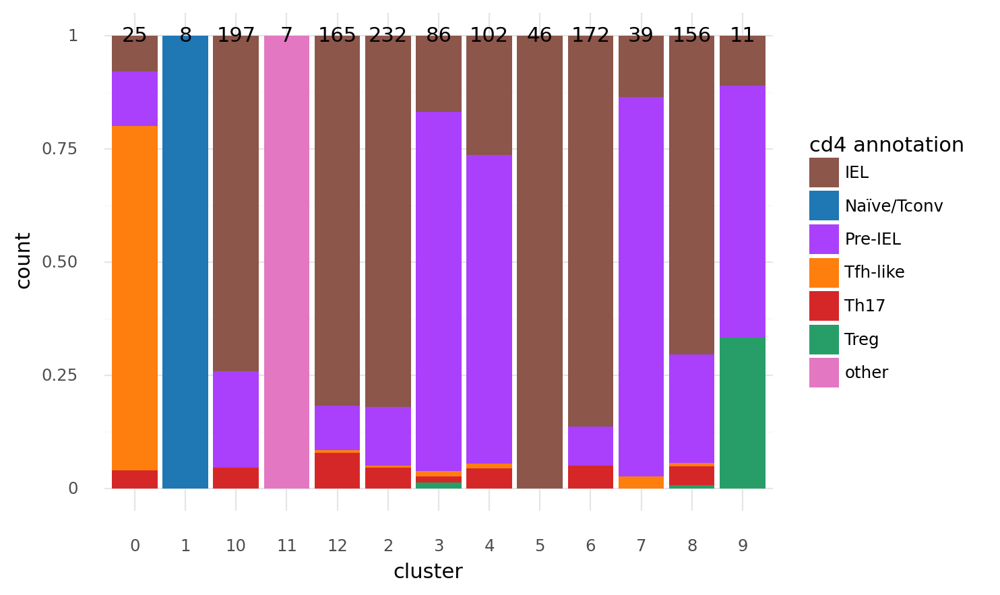

<ggplot: (8784397688688)>

In [337]:
ggplot(df, aes(x="cluster", fill="cd4 annotation")) + geom_bar(position = "fill") + scale_fill_manual(
    np.array(ad.uns["cd4 annotation_colors"])[col_is]) + geom_text(cluster_clone_sizes, aes(
    x="cluster", label="clone_id_size"), y = 1, inherit_aes=False, color="black") + theme_minimal() + theme()

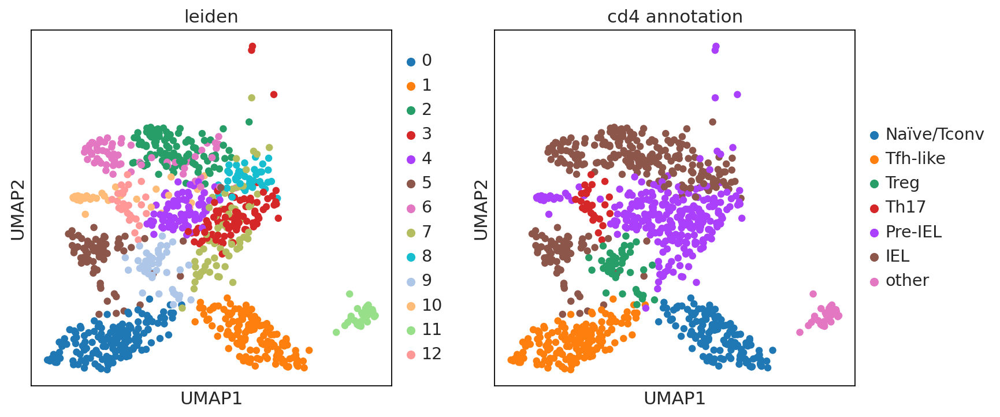

In [278]:
sc.pl.umap(ad, color = ["leiden", "cd4 annotation"])

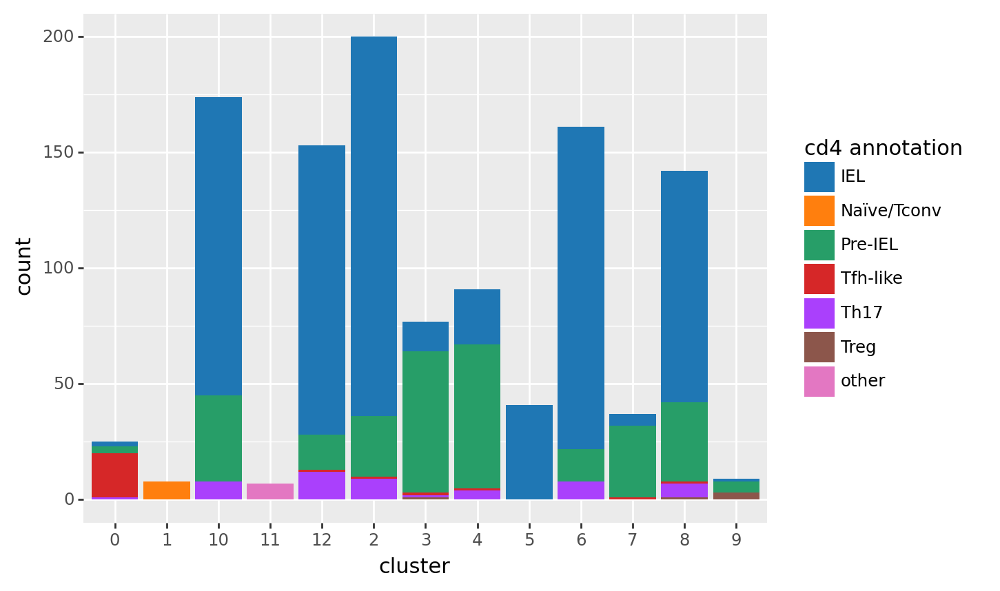

<ggplot: (8784949632630)>

In [254]:
ggplot(df, aes(x="cluster", fill="cd4 annotation")) + geom_bar() + scale_fill_manual(ad.uns["cd4 annotation_colors"]) 

/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/facets/facet.py:440: PlotnineWarning: If you need more space for the y-axis tick text use ... + theme(subplots_adjust={'hspace': 0.25}). Choose an appropriate value for 'hspace'


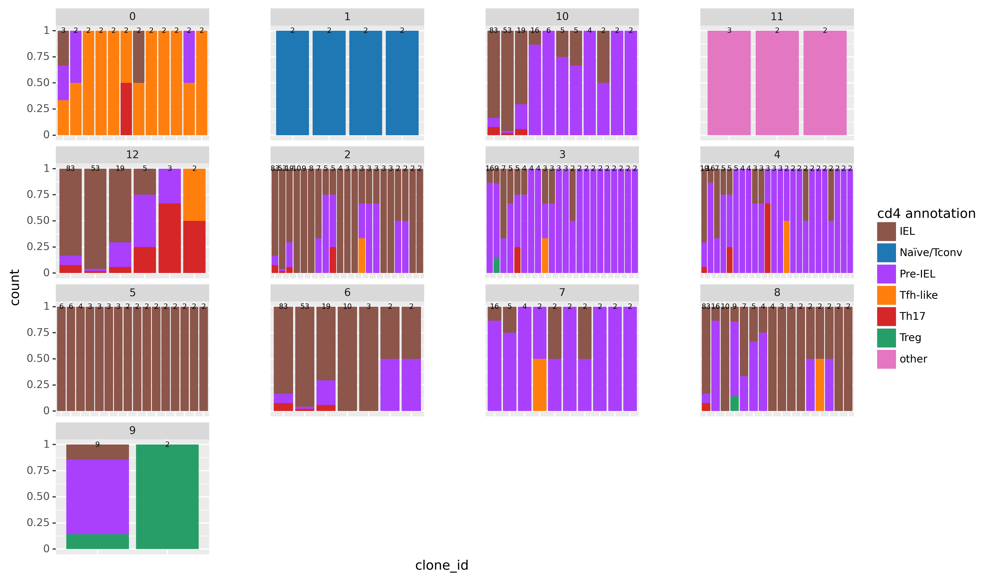

<ggplot: (8785070021003)>

In [338]:
p
#                                         lambda x:  [np.where(ad.obs[
#                                             "cd4 annotation"].unique() == x)[0][0]]))

/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/facets/facet.py:440: PlotnineWarning: If you need more space for the y-axis tick text use ... + theme(subplots_adjust={'hspace': 0.25}). Choose an appropriate value for 'hspace'


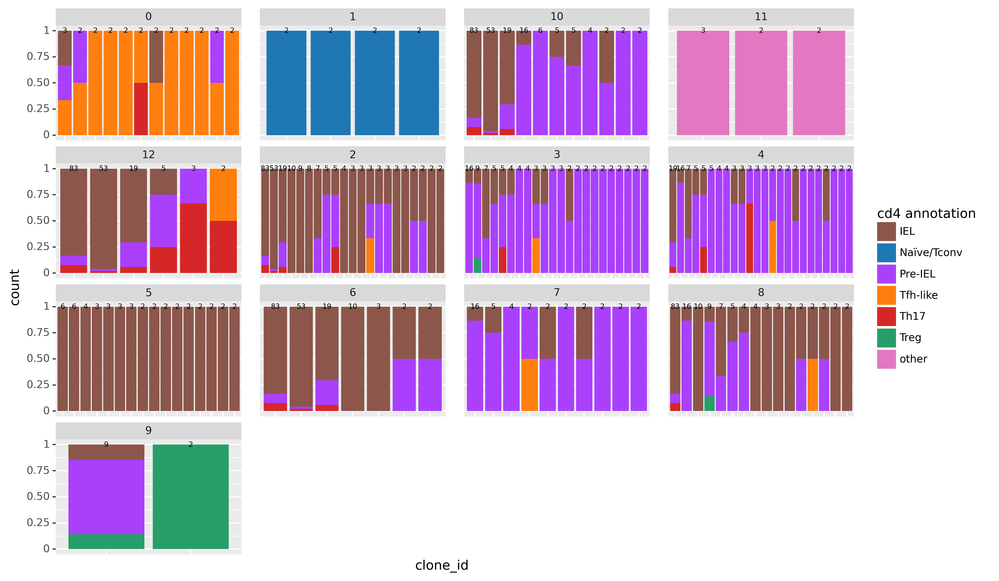

<ggplot: (8784398567223)>

In [342]:
p

In [343]:
ggsave(p, "paper_figures/supplemental/cd4/clone_sharing_annotation.all_cl.pdf")

/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/ggplot.py:718: PlotnineWarning: Saving 12 x 8 in image.
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Filename: paper_figures/supplemental/cd4/clone_sharing_annotation.all_cl.pdf
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/facets/facet.py:440: PlotnineWarning: If you need more space for the y-axis tick text use ... + theme(subplots_adjust={'hspace': 0.25}). Choose an appropriate value for 'hspace'


/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/anndata/compat/__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['clone_id']['distances'] that happens to be dimensioned at n_obs×n_obs (944×944).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/pandas/core/generic.py:5604: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/tmp/ipykernel_168193/2781146938.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/anndata/compat/__init__.py:263: FutureWarning: Durin

/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/anndata/compat/__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['clone_id']['distances'] that happens to be dimensioned at n_obs×n_obs (944×944).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/pandas/core/generic.py:5604: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/tmp/ipykernel_168193/2781146938.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/anndata/compat/__init__.py:263: FutureWarning: Durin

    clone_id  clone_id_size cluster
0         23            2.0       0
1         30            2.0       0
2         99            2.0       0
3        104            2.0       0
4        152            2.0       0
..       ...            ...     ...
149      653            3.0       8
150      748            2.0       8
151      766            2.0       8
152      100            9.0       9
153      112            2.0       9

[154 rows x 3 columns]
    clone_id  clone_id_size cluster
0         23              2       0
1         30              2       0
2         99              2       0
3        104              2       0
4        152              2       0
..       ...            ...     ...
149      653              3       8
150      748              2       8
151      766              2       8
152      100              9       9
153      112              2       9

[154 rows x 3 columns]


/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/facets/facet.py:440: PlotnineWarning: If you need more space for the y-axis tick text use ... + theme(subplots_adjust={'hspace': 0.25}). Choose an appropriate value for 'hspace'


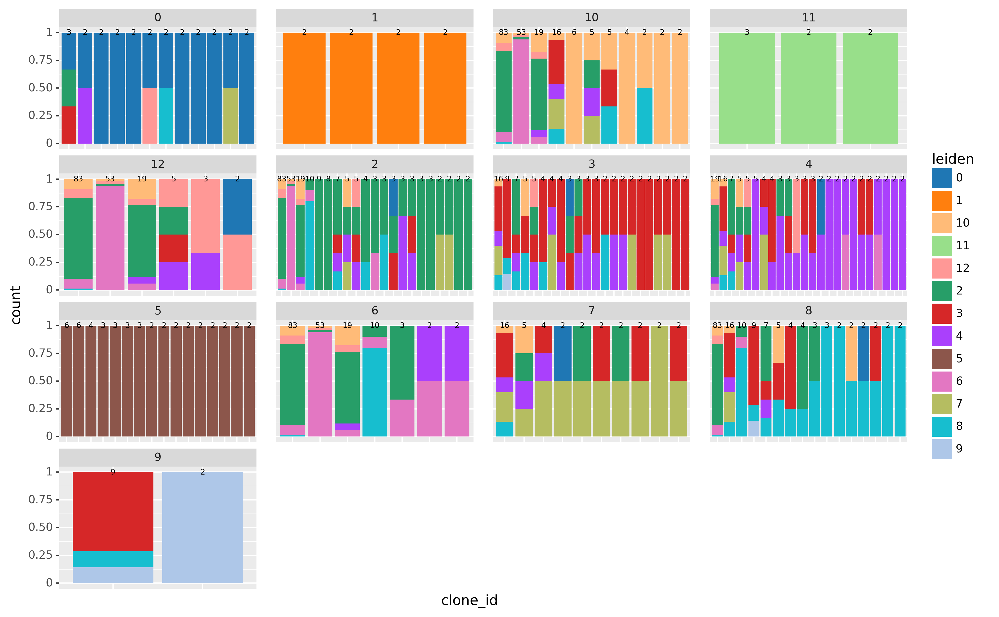

<ggplot: (8784951246418)>

In [344]:
_, p2 = make_cl_plot("leiden")
p2

/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/facets/facet.py:440: PlotnineWarning: If you need more space for the y-axis tick text use ... + theme(subplots_adjust={'hspace': 0.25}). Choose an appropriate value for 'hspace'


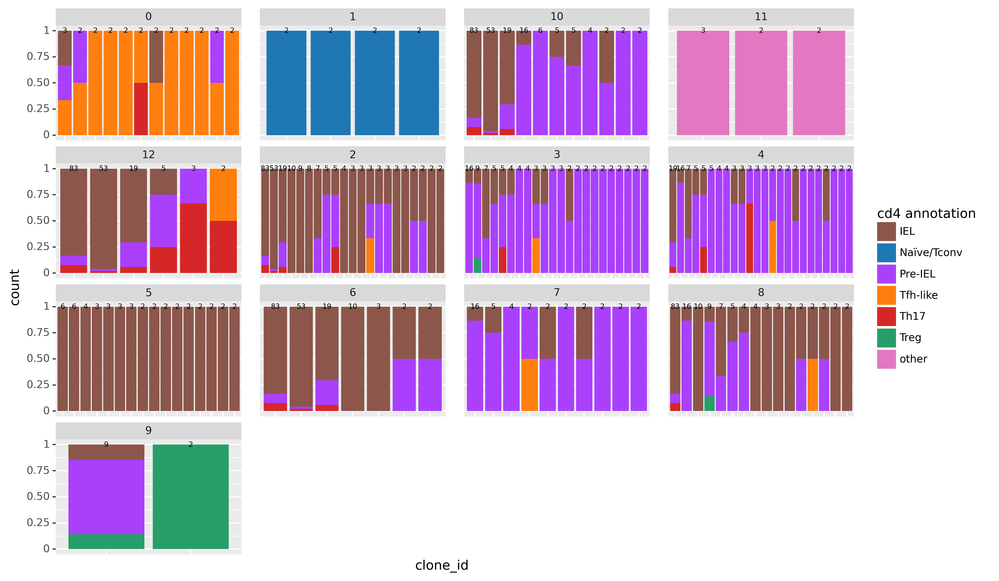

<ggplot: (8784398567223)>

In [345]:
p

In [ ]:
make_cl_plot()

/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/anndata/compat/__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['clone_id']['distances'] that happens to be dimensioned at n_obs×n_obs (944×944).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/pandas/core/generic.py:5604: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/tmp/ipykernel_168193/902182725.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/anndata/compat/__init__.py:263: FutureWarning: During

/tmp/ipykernel_168193/902182725.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/anndata/compat/__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['clone_id']['distances'] that happens to be dimensioned at n_obs×n_obs (944×944).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/pandas/core/generic.py:5604: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/tmp/ipykernel_168193/902182725.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

    clone_id  clone_id_size cluster
0         23            2.0       0
1         30            2.0       0
2         99            2.0       0
3        104            2.0       0
4        152            2.0       0
..       ...            ...     ...
149      653            3.0       8
150      748            2.0       8
151      766            2.0       8
152      100            9.0       9
153      112            2.0       9

[154 rows x 3 columns]
    clone_id  clone_id_size cluster
0         23              2       0
1         30              2       0
2         99              2       0
3        104              2       0
4        152              2       0
..       ...            ...     ...
149      653              3       8
150      748              2       8
151      766              2       8
152      100              9       9
153      112              2       9

[154 rows x 3 columns]


/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/facets/facet.py:440: PlotnineWarning: If you need more space for the y-axis tick text use ... + theme(subplots_adjust={'hspace': 0.25}). Choose an appropriate value for 'hspace'


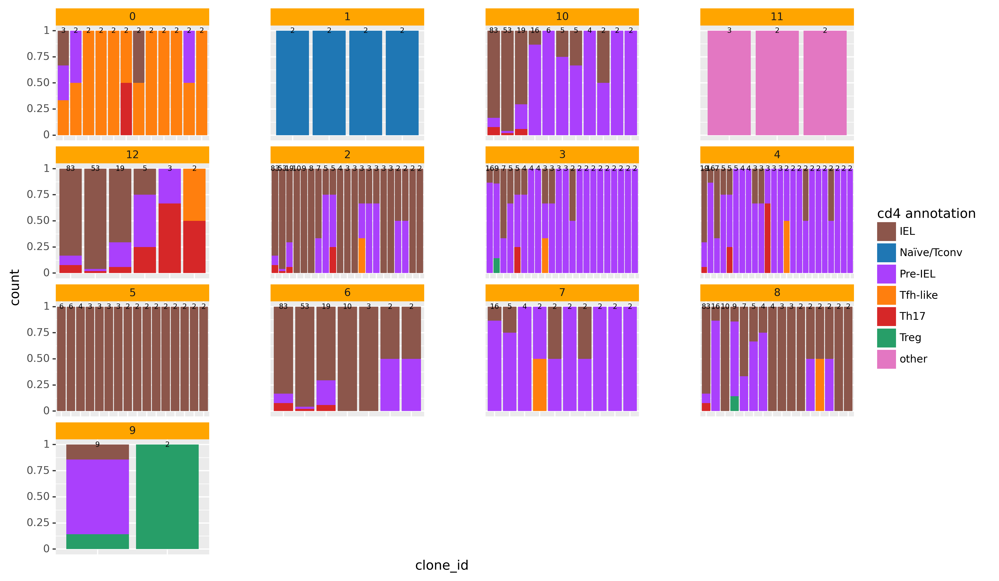

<ggplot: (8785016099386)>

In [211]:
p = make_cl_plot()


In [ ]:
make_cl_plot()

In [200]:
clones_gt_1 = ad.obs[(ad.obs.clone_id_size > 1)]
clones_gt_1.head()

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,doublet_score,predicted_doublet,potential_doublet,sample,raw_biotin,...,IR_VJ_2_v_call,IR_VDJ_1_v_call,IR_VDJ_2_v_call,has_ir,receptor_type,receptor_subtype,chain_pairing,clone_id,clone_id_size,cd4 annotation
AAACGGGGTCTGGTCG-1,1938,1938,8362.0,35.0,0.418560,0.058353,False,False,IEL 4,424.0,...,NaN,TRBV1,NaN,True,TCR,TRA+TRB,single pair,6,2.0,IEL
AAAGATGTCAGTACGT-1,2639,2639,9675.0,80.0,0.826873,0.023787,False,False,IEL 3,570.0,...,TRAV9-2,TRBV16,NaN,True,TCR,TRA+TRB,extra VJ,10,2.0,Pre-IEL
AAAGCAACACGGCGTT-1,2045,2044,5376.0,31.0,0.576637,0.051395,False,False,IEL 3,684.0,...,NaN,TRBV13-3,NaN,True,TCR,TRA+TRB,single pair,12,83.0,IEL
AAAGCAACACTCAGGC-1,2398,2397,9784.0,91.0,0.930090,0.015544,False,False,IEL 2,174.0,...,NaN,TRBV13-3,NaN,True,TCR,TRA+TRB,single pair,13,19.0,IEL
AAATGCCCATCGGTTA-1,1801,1800,6554.0,86.0,1.312176,0.063721,False,False,IEL 2,43.0,...,NaN,TRBV5,NaN,True,TCR,TRA+TRB,single pair,23,2.0,Tfh-like


In [205]:
clones_gt_1_v2 = clones_gt_1.groupby(["leiden", "clone_id", "annotation"]).count()[["n_genes"]].rename(columns = {
    "n_genes": "count"}).reset_index()
clones_gt_1_v2 = clones_gt_1_v2[clones_gt_1_v2["count"] > 0]

In [206]:
clones_gt_1_v2.head()

,leiden,clone_id,annotation,count
20,0,23,CD4,1
30,0,30,CD4,2
124,0,99,CD4,1
132,0,104,CD4,2
192,0,152,CD4,2


In [ ]:
ggplot(clones_gt_1_v2, aes(x="leiden", y="count"))

In [26]:
?geom_text

In [27]:
p = make_cl_plot()

/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/anndata/compat/__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['clone_id']['distances'] that happens to be dimensioned at n_obs×n_obs (915×915).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/pandas/core/generic.py:5604: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/tmp/ipykernel_105259/2056693367.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/anndata/compat/__init__.py:263: FutureWarning: Durin

   clone_id  clone_id_size cluster
0        39            3.0       3
1        51           16.0       3
2        76            5.0       3
3        78            2.0       3
4        87            7.0       3
..      ...            ...     ...
84      196            5.0      10
85      371            2.0      10
86      522            2.0      10
87      178            6.0      10
88      598            2.0      10

[89 rows x 3 columns]
   clone_id  clone_id_size cluster
0        39              3       3
1        51             16       3
2        76              5       3
3        78              2       3
4        87              7       3
..      ...            ...     ...
84      196              5      10
85      371              2      10
86      522              2      10
87      178              6      10
88      598              2      10

[89 rows x 3 columns]


/tmp/ipykernel_105259/2056693367.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/anndata/compat/__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['clone_id']['distances'] that happens to be dimensioned at n_obs×n_obs (915×915).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/pandas/core/generic.py:5604: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/tmp/ipykernel_105259/2056693367.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from 

/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/facets/facet.py:440: PlotnineWarning: If you need more space for the y-axis tick text use ... + theme(subplots_adjust={'hspace': 0.25}). Choose an appropriate value for 'hspace'


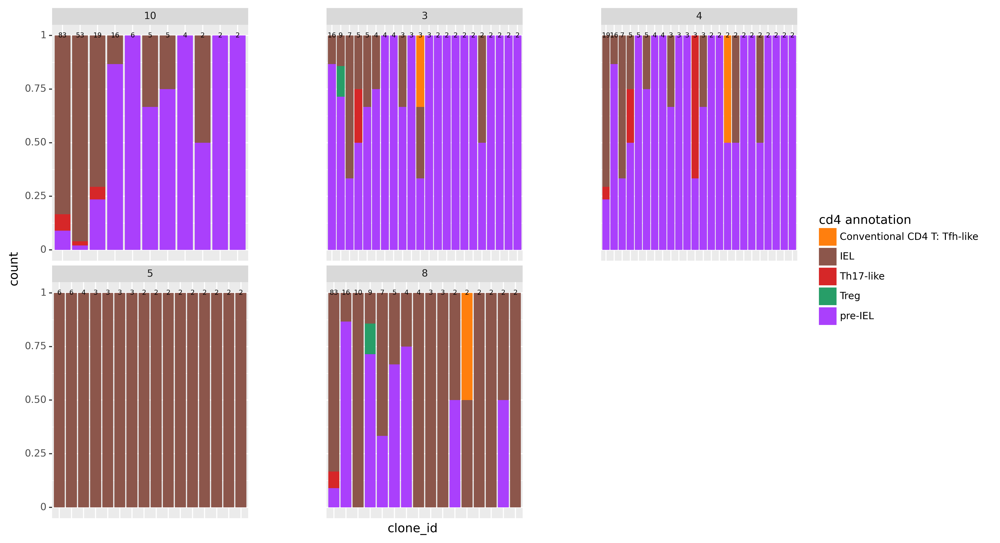

<ggplot: (8742794879236)>

In [28]:
p

In [346]:
ggsave(p2, "paper_figures/supplemental/cd4/clone_sharing_leiden.all_cl.pdf")

/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/ggplot.py:718: PlotnineWarning: Saving 12 x 8 in image.
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Filename: paper_figures/supplemental/cd4/clone_sharing_leiden.all_cl.pdf
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/facets/facet.py:440: PlotnineWarning: If you need more space for the y-axis tick text use ... + theme(subplots_adjust={'hspace': 0.25}). Choose an appropriate value for 'hspace'


/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/facets/facet.py:440: PlotnineWarning: If you need more space for the y-axis tick text use ... + theme(subplots_adjust={'hspace': 0.25}). Choose an appropriate value for 'hspace'


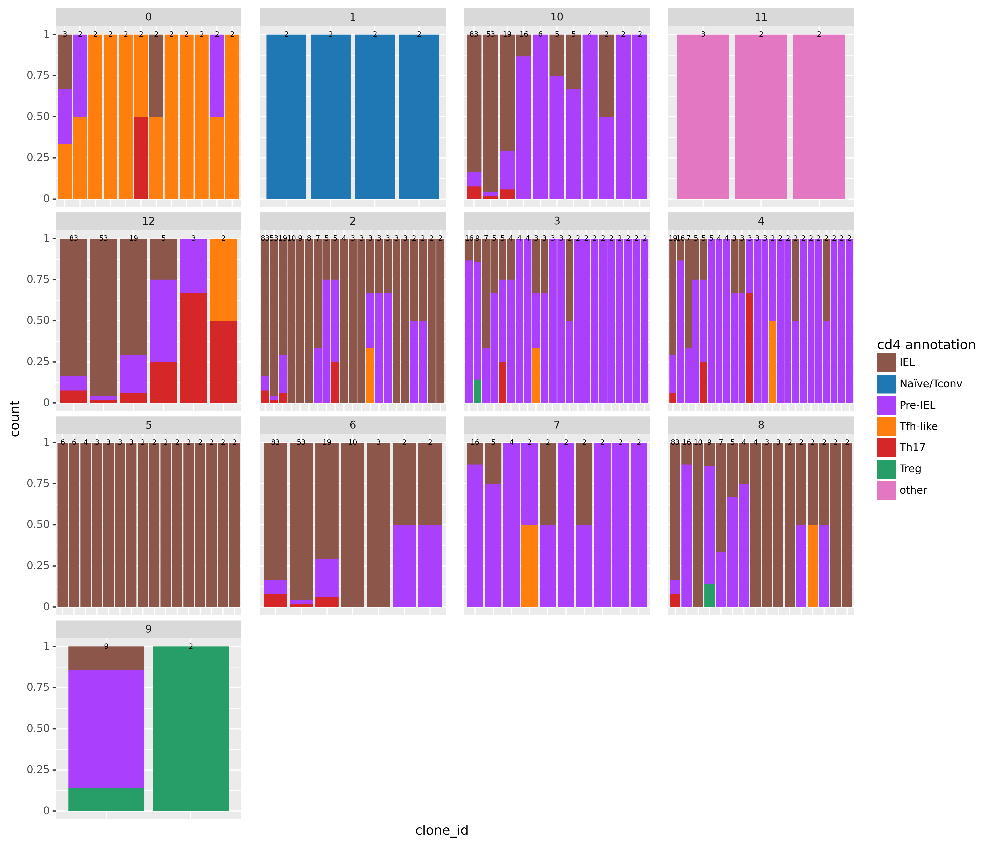

<ggplot: (8784396150742)>

In [348]:
p + theme(figure_size=(12, 12))

In [353]:
ggsave(p + theme(figure_size=(12, 12)), "paper_figures/supplemental/cd4/clone_sharing_annotation.pdf")

/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/ggplot.py:718: PlotnineWarning: Saving 12 x 12 in image.
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Filename: paper_figures/supplemental/cd4/clone_sharing_annotation.pdf
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/facets/facet.py:440: PlotnineWarning: If you need more space for the y-axis tick text use ... + theme(subplots_adjust={'hspace': 0.25}). Choose an appropriate value for 'hspace'


In [30]:
p2 = make_cl_plot("leiden")

/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/anndata/compat/__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['clone_id']['distances'] that happens to be dimensioned at n_obs×n_obs (915×915).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/pandas/core/generic.py:5604: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/tmp/ipykernel_105259/2056693367.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/anndata/compat/__init__.py:263: FutureWarning: Durin

   clone_id  clone_id_size cluster
0        39            3.0       3
1        51           16.0       3
2        76            5.0       3
3        78            2.0       3
4        87            7.0       3
..      ...            ...     ...
84      196            5.0      10
85      371            2.0      10
86      522            2.0      10
87      178            6.0      10
88      598            2.0      10

[89 rows x 3 columns]
   clone_id  clone_id_size cluster
0        39              3       3
1        51             16       3
2        76              5       3
3        78              2       3
4        87              7       3
..      ...            ...     ...
84      196              5      10
85      371              2      10
86      522              2      10
87      178              6      10
88      598              2      10

[89 rows x 3 columns]


/tmp/ipykernel_105259/2056693367.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/anndata/compat/__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['clone_id']['distances'] that happens to be dimensioned at n_obs×n_obs (915×915).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/pandas/core/generic.py:5604: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/tmp/ipykernel_105259/2056693367.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from 

/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/facets/facet.py:440: PlotnineWarning: If you need more space for the y-axis tick text use ... + theme(subplots_adjust={'hspace': 0.25}). Choose an appropriate value for 'hspace'


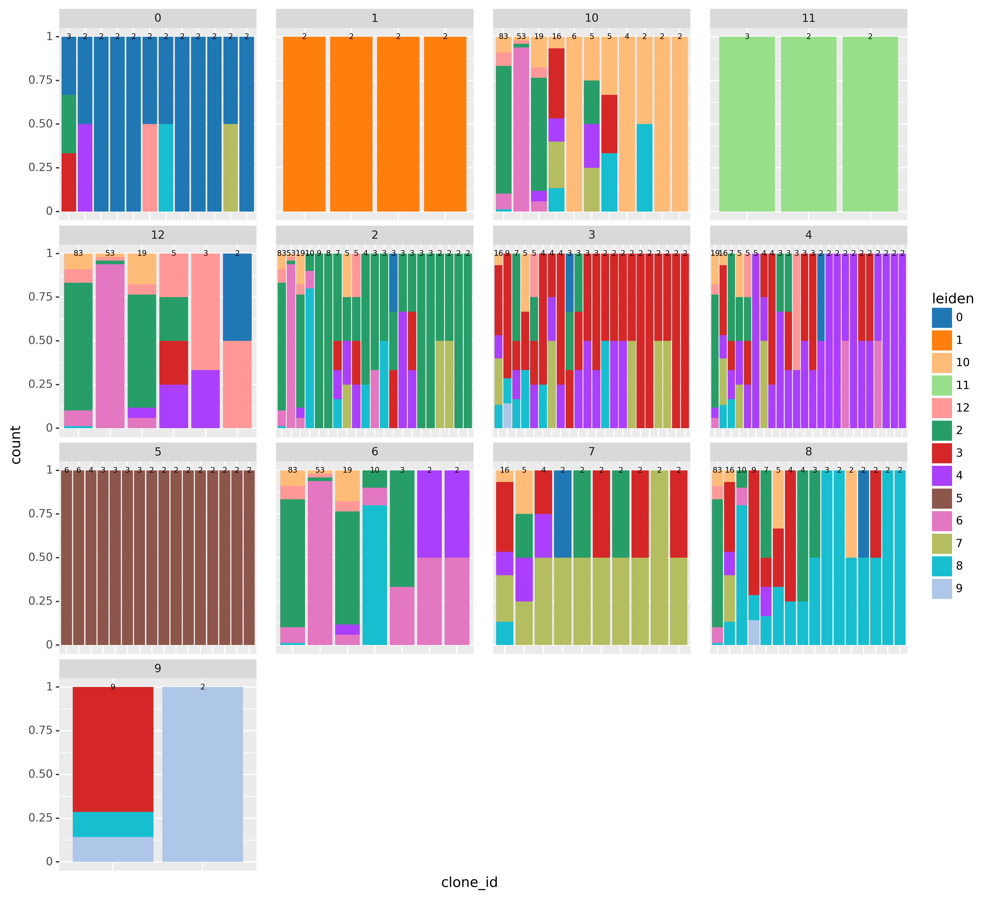

<ggplot: (8784382011588)>

In [352]:
p2 + theme(figure_size=(12, 12))

In [351]:
ggsave(p2 + theme(figure_size=(12, 12)), "paper_figures/supplemental/cd4/clone_sharing_leiden.all_cl.pdf")

/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/ggplot.py:718: PlotnineWarning: Saving 12 x 12 in image.
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Filename: paper_figures/supplemental/cd4/clone_sharing_leiden.all_cl.pdf
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/facets/facet.py:440: PlotnineWarning: If you need more space for the y-axis tick text use ... + theme(subplots_adjust={'hspace': 0.25}). Choose an appropriate value for 'hspace'


/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/facets/facet.py:440: PlotnineWarning: If you need more space for the y-axis tick text use ... + theme(subplots_adjust={'hspace': 0.25}). Choose an appropriate value for 'hspace'


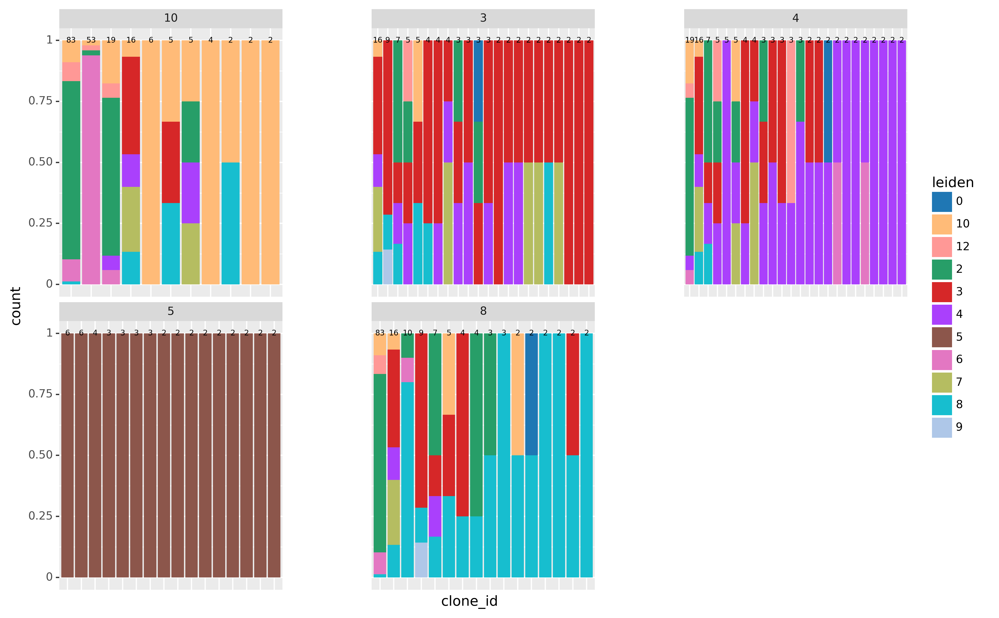

<ggplot: (8742794502795)>

In [32]:
p2

## now look into correlations between gene expression and biotin levels

In [42]:
# selecting some interesting genes that correlate strongly with biotin levels
cd4_genes = ["Nkg7", "Ccl5", "Slamf6", "Lef1", "Gzma", "Gzmb", "Id2", "Itgae", "Jaml", "Sell", "Tcf7", "Itgb7"]

In [43]:
from scipy.stats import spearmanr

In [158]:
og_cd4_spearman_df = cd4_spearman_df.copy()

In [159]:
cd4_spearman_df = make_corr_df(ad)

## <font color = purple> Main figure

In [160]:
cd4_spearman_df.shape

(14332, 4)

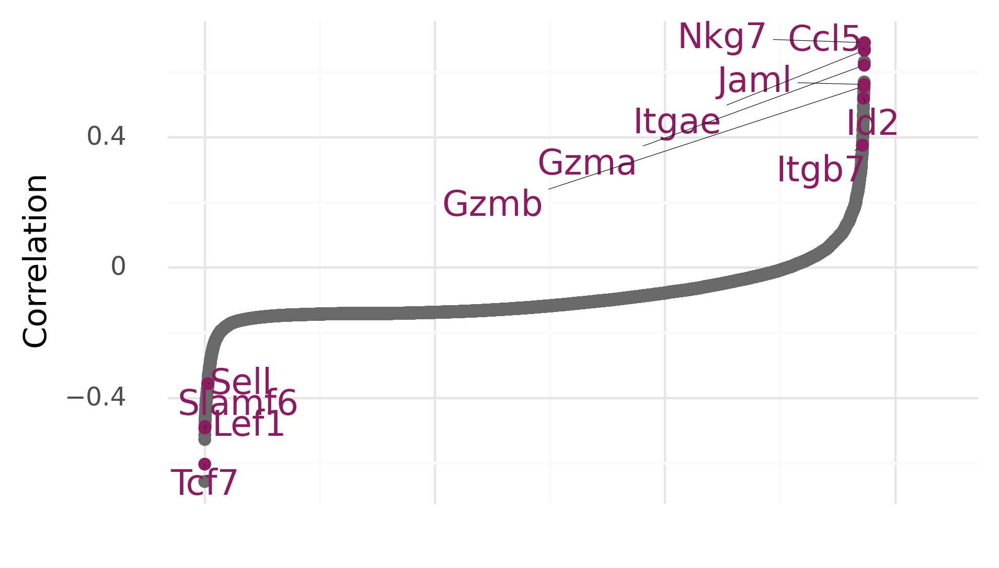

<ggplot: (8785016099575)>

In [161]:
make_corr_plot(cd4_spearman_df)

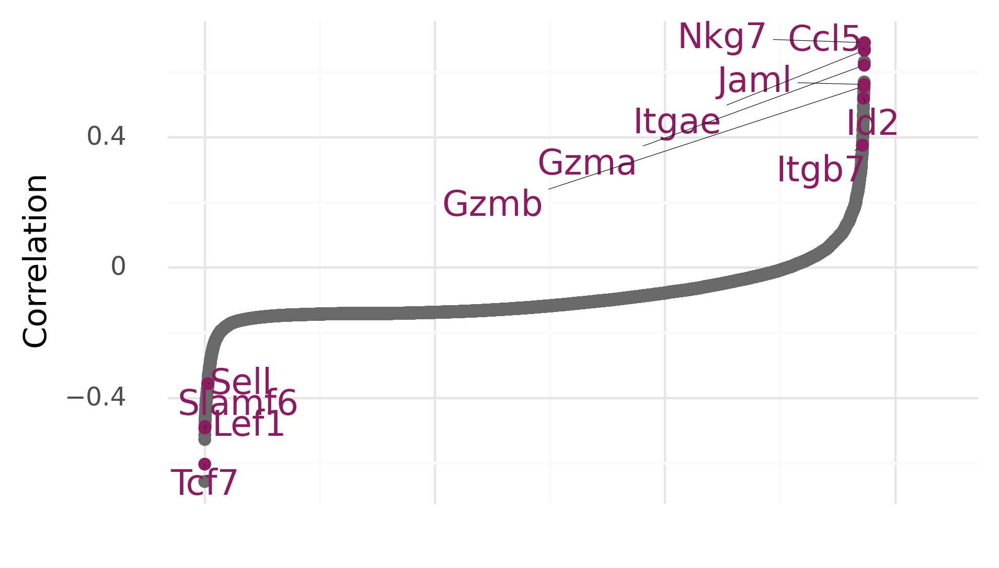

<ggplot: (8742869043685)>

In [36]:
## OG ONE
p = make_corr_plot(cd4_spearman_df)
p

In [37]:
ggsave(p, "paper_figures/corrs_panel_6.pdf")

/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/ggplot.py:718: PlotnineWarning: Saving 5 x 3 in image.
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Filename: paper_figures/corrs_panel_6.pdf


## Make sure correlations are consistent across the 3 different samples

In [38]:
cd4_spearmans = pd.DataFrame()
for s in ad.obs["sample"].unique():
    df =  make_corr_df(ad[ad.obs["sample"] == s])
    df['sample'] = s
    cd4_spearmans = pd.concat([cd4_spearmans, df])

/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/anndata/compat/__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['clone_id']['distances'] that happens to be dimensioned at n_obs×n_obs (915×915).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/anndata/compat/__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['clone_id']['distances'] that happens to be dimensioned at n_obs×n_obs (915×915).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/anndata/compat/__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['clone_id']['distances'] that happens to be dimensioned at n_obs×n_obs (915×915).

These matrices should now be stored in the .ob

In [39]:
cd4_spearmans.head()

,gene,corr,interesting gene,i,sample
4670,Tmsb10,-0.574919,False,0.0,IEL 4
8666,Tcf7,-0.542788,True,0.1,IEL 4
679,Slamf6,-0.503520,True,0.2,IEL 4
6161,Tspan32,-0.495848,False,0.3,IEL 4
6974,Izumo1r,-0.480384,False,0.4,IEL 4


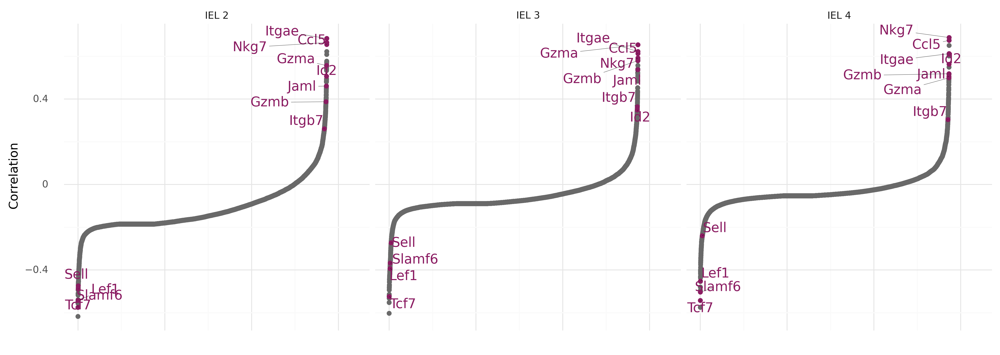

<ggplot: (8742792758655)>

In [40]:
cd4_supp = make_corr_plot(cd4_spearmans) + facet_wrap("~ sample") + theme(figure_size=(15, 5))
cd4_supp

In [41]:
ggsave(cd4_supp, "paper_figures/supplemental/cd4/sample_cd4_biotin_corrs.pdf")

/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/ggplot.py:718: PlotnineWarning: Saving 15 x 5 in image.
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Filename: paper_figures/supplemental/cd4/sample_cd4_biotin_corrs.pdf


In [42]:
testing_corrs = cd4_spearmans.pivot(index = "gene", columns = "sample", values = "corr")
testing_corrs.head()

sample,IEL 2,IEL 3,IEL 4
gene,,,
0610009B22Rik,-0.176720,-0.062415,-0.021278
0610009L18Rik,-0.073334,-0.045192,-0.068122
0610010F05Rik,-0.161953,-0.097071,-0.033670
0610010K14Rik,-0.016378,0.062774,-0.210598
0610012G03Rik,-0.123888,-0.014490,0.024517


In [43]:
spearmanr(testing_corrs["IEL 2"], testing_corrs["IEL 3"])

SpearmanrResult(correlation=0.6272250655254846, pvalue=0.0)

In [44]:
spearmanr(testing_corrs["IEL 2"], testing_corrs["IEL 4"])

SpearmanrResult(correlation=0.4933630694410591, pvalue=0.0)

In [45]:
spearmanr(testing_corrs["IEL 3"], testing_corrs["IEL 4"])

SpearmanrResult(correlation=0.46825508532439014, pvalue=0.0)

In [46]:
spearmanr(testing_corrs[(abs(testing_corrs["IEL 2"]) > 0.2) | 
                        (abs(testing_corrs["IEL 3"]) > 0.2)]["IEL 2"], 
          testing_corrs[(abs(testing_corrs["IEL 2"]) > 0.2) | 
                        (abs(testing_corrs["IEL 3"]) > 0.2)]["IEL 3"])

SpearmanrResult(correlation=0.691360868922745, pvalue=1.162682437299687e-217)

In [47]:
spearmanr(testing_corrs[(abs(testing_corrs["IEL 2"]) > 0.2) | 
                        (abs(testing_corrs["IEL 4"]) > 0.2)]["IEL 2"], 
          testing_corrs[(abs(testing_corrs["IEL 2"]) > 0.2) | 
                        (abs(testing_corrs["IEL 4"]) > 0.2)]["IEL 4"])

SpearmanrResult(correlation=0.6650264772833863, pvalue=2.3965950935329676e-196)

In [48]:
spearmanr(testing_corrs[(abs(testing_corrs["IEL 4"]) > 0.2) | 
                        (abs(testing_corrs["IEL 3"]) > 0.2)]["IEL 4"], 
          testing_corrs[(abs(testing_corrs["IEL 4"]) > 0.2) | 
                        (abs(testing_corrs["IEL 3"]) > 0.2)]["IEL 3"])

SpearmanrResult(correlation=0.7870537137139214, pvalue=5.3083526861956014e-120)

## supplemental figure: remove the conventional clusters, do we still see these correlations?

In [49]:
np.sum(ad.obs["cd4 annotation"].isna())

0

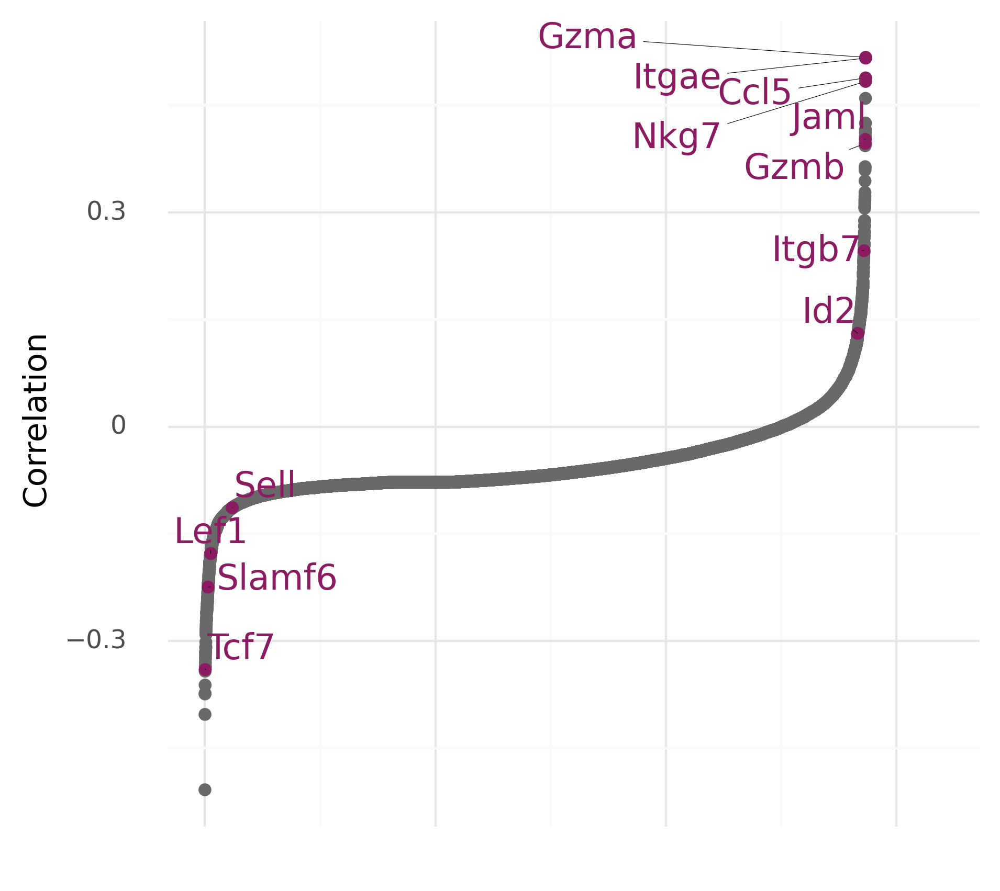

<ggplot: (8785041046071)>

In [96]:
#non_conv_spearman_df = make_corr_df(ad[~ad.obs["cd4 annotation"].str.startswith("Conventional CD4")])
p2 = make_corr_plot(non_conv_spearman_df) + theme(figure_size=(5,5))
p2

In [97]:
ggsave(p2, "paper_figures/supplemental/cd4/no_conv_cd4_biotin_corrs.pdf")

/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/ggplot.py:718: PlotnineWarning: Saving 5 x 5 in image.
/Genomics/grid/users/skwalker/new_scvi/lib/python3.9/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Filename: paper_figures/supplemental/cd4/no_conv_cd4_biotin_corrs.pdf


## Main figure: SC panel 

In [45]:
main_cd4_genes = ["Ccl5", "Itgae", "Gzma", "Jaml", "Sell", "Tcf7"]
calc_corr = lambda g: np.round(cd4_spearman_df[cd4_spearman_df["gene"] == g]["corr"].values[0], 3)

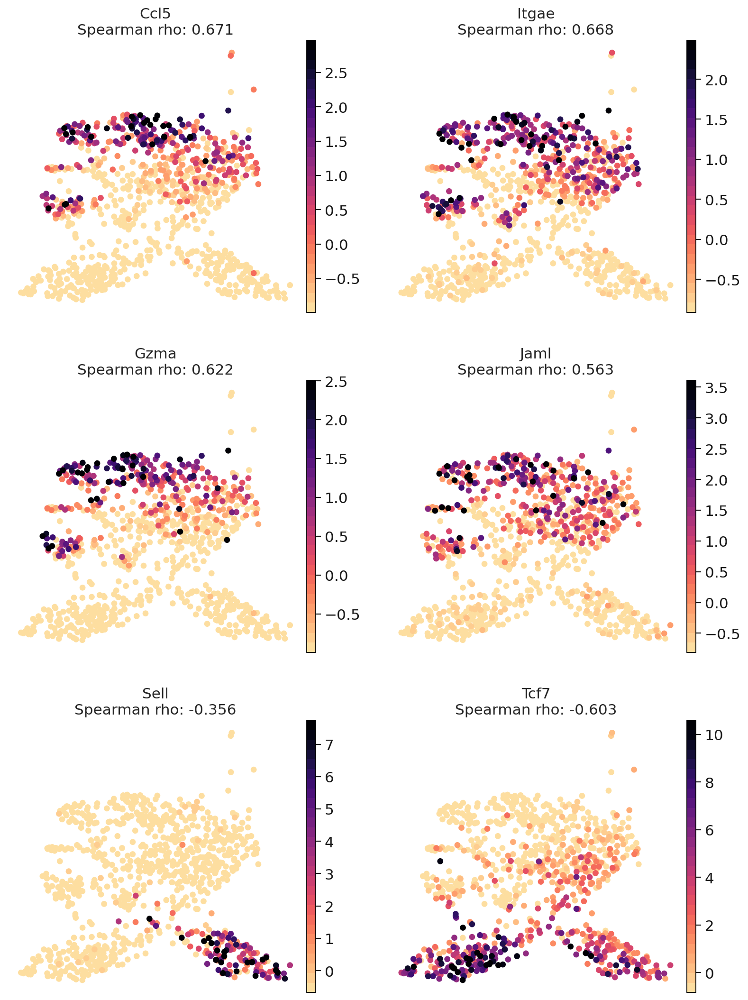

In [150]:
sc.settings.figdir="paper_figures"
sc.set_figure_params(figsize=(5,5), vector_friendly=False)

sc.pl.umap(ad, color = main_cd4_genes, vmin = "p2", vmax="p98", layer = "pearson_theta_1", cmap=magma_cmap,
               title = [ "%s\nSpearman rho: %s"%(g, calc_corr(g)) for g in main_cd4_genes], save="_panel_7.pdf",
          ncols=2, frameon = False)

In [146]:
tcr_ad_obs = ad.obs[["clone_id_size", "normalized biotin"]].dropna()
spearmanr(tcr_ad_obs["normalized biotin"], tcr_ad_obs["clone_id_size"])

SpearmanrResult(correlation=0.5812464368081968, pvalue=5.73432174006444e-78)